In [1]:
#import packages. 
#Note that if you get an error when importing saphires that certain packages are not found, 
#you'll need to pip install them as well
import numpy as np
import os
from scipy.optimize import curve_fit
import saphires as saph
import pickle as pkl
from scipy.ndimage import gaussian_filter
import scipy


In [2]:
import matplotlib
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
%matplotlib inline 

In [3]:
star = "HUVir"
path = r'C:\Users\astro\SSGs\stars\\' + star + '\\' #r"D:\SSGs\stars\\" + star + '\\'
spec_path = r'C:\Users\astro\SSG_Spectra\H-alpha_Analysis'
datfile = path + star + "_coude_head.dat"
RV_file = r'C:\Users\astro\SSGs\Data3\starstxt3' + '\\' + star + '.txt' #r'D:\SSGs\Data3\starstxt3' + '\\' + star + '.txt'

Ha_file = spec_path + "\Analyze_Spectra\Analyze_" + star + ".txt"
CaH_file = spec_path + '\Analyze_CaH\CaH_Analyze_' + star + '.txt'
CaK_file = spec_path + '\Analyze_CaH\CaK_Analyze_' + star + '.txt'

#Constants
R_coude = 60000.0 #spectral resolution of the Coude. 
c = (2.9979245*10**5) #speed of light in km/s
M_sun = 1.988416E30 #kg
R_sun = 6.95700E5 #km
AU = 1.49597870700E8 #km
G = 6.674E-11 #N*m/kg

# Functions

In [4]:
#Functions 

#File Finder
def fitfile_open(file_name):
    with open(file_name, 'r') as file:
        fit_data = [line.strip().split("/") for line in file]
    
    dat_type = fit_data[0]
    del fit_data[0]
    return fit_data, dat_type

#Returns Guesses, parameters 
def guess_find(fit_dat, print_dates = False):
    guess = [np.array(temp[7].strip('[]').split(","), dtype = float) for temp in fit_dat]
    lims = [np.array(res[6].strip('[]').split(","), dtype = float) for res in fit_dat]
    date_line = [day[1] for day in fit_dat]

    if print_dates == True:
        return lims, guess, date_line
    else:
        return lims, guess

#Wavelength to velocity conversion
def velocity_spec(wav, bvcorr, lam):
    v_spec = ((wav-lam)/lam)*c + bvcorr #+ #(bvcorr/c)
    return v_spec

def vel_to_wav(vel, bvcorr, lam):
    l_vel = lam * ((vel - bvcorr)/c + 1)
    return l_vel


#Filters wavelengths to certain points
def filterer(region, bounds, spect):  
    spec_where = np.where((spect['wav'][region]>bounds[0]) & (spect['wav'][region]<bounds[1]))
    tempList_wavelength = spect['wav'][region][spec_where]
    tempList_flux = spect['flux'][region][spec_where]
    
    return  tempList_flux,  tempList_wavelength

#Adjust boundaries of spectrum
def adjust_bounds(arr, arr2, bounds):
    filt_where = np.where((arr > bounds[0]) & (arr < bounds[1]))
    tempList_wav = arr[filt_where]
    tempList_flux2 = arr2[filt_where]
    return tempList_flux2, tempList_wav

def gauss(x, *p): 
    A, mu, sigma, B = p
    y = A * np.exp(-((x - mu)**2)/(2 * sigma ** 2 )) + B
    return y

def integrate(popt):
    upperlam = popt[1]+2
    lowerlam = popt[1]-2
    IntHa = scipy.integrate.quad(gauss, lowerlam, upperlam, args = (popt[0], popt[1], popt[2],popt[3]))
    Int1 = (upperlam - lowerlam)
    B = popt[3]
    Int2 = IntHa[0]/B
    IntHA = Int1-Int2
    return IntHA


# Load Files Here

In [5]:
#RV Info
with open(RV_file, 'r') as file:
    dat_RV = file.readlines()
rv_data = [k.strip(',\n').strip('[]').strip("\"\"").strip(']').split(',') for k in dat_RV[6:-1]]

#Coude Data
with open(datfile, 'r') as file:
    datfile_data = [line.strip().split(",") for line in file]
del datfile_data[0]  #Removes 1st row    

#Opens ha fit parameters
ha_data, ha_datTypes = fitfile_open(Ha_file)
CaH_data, CaH_datTypes = fitfile_open(CaH_file)
CaK_data, CaK_datTypes = fitfile_open(CaK_file)


In [6]:
print('Is there bad/Missing data: ', len(rv_data) != len(datfile_data))
for i in range(len(rv_data)):
    print(datfile_data[i][0], rv_data[i][0])

Is there bad/Missing data:  False
HUVir_2020-05-10_0.pkl 'HUVir_2020-05-10_0_4400_4.5.p'
HUVir_2021-01-31_0.pkl 'HUVir_2021-01-31_0_4400_4.5.p'
HUVir_2021-03-30_0.pkl 'HUVir_2021-03-30_0_4400_4.5.p'
HUVir_2021-04-01_0.pkl 'HUVir_2021-04-01_0_4400_4.5.p'
HUVir_2021-04-23_0.pkl 'HUVir_2021-04-23_0_4400_4.5.p'
HUVir_2021-04-24_0.pkl 'HUVir_2021-04-24_0_4400_4.5.p'
HUVir_2021-04-25_0.pkl 'HUVir_2021-04-25_0_4400_4.5.p'
HUVir_2021-05-04_0.pkl 'HUVir_2021-05-04_0_4400_4.5.p'
HUVir_2021-05-29_0.pkl 'HUVir_2021-05-29_0_4400_4.5.p'
HUVir_2021-05-29_1.pkl 'HUVir_2021-05-29_1_4400_4.5.p'
HUVir_2021-05-30_0.pkl 'HUVir_2021-05-30_0_4400_4.5.p'
HUVir_2021-12-14_0.pkl 'HUVir_2021-12-14_0_4400_4.5.p'


In [7]:
#remove Files here
# del datfile_data[i]

In [8]:
data = np.array(datfile_data)
#Number of files
numFiles = len(data)
files = data[:,0]

In [9]:
#Loading Files
file = path +  files[0]
file2 = path  + files[1]
file3 = path  + files[2]

file4 = path  + files[3]
file5 = path  + files[4]
file6 = path + files[5]

file7 = path + files[6]
file8 = path + files[7]
file9 = path + files[8]

file10 = path + files[9]
file11 = path + files[10]
file12 = path + files[11]

spec = pkl.load(open(file,'rb'))
spec2 = pkl.load(open(file2,'rb'))
spec3 = pkl.load(open(file3,'rb'))

spec4 = pkl.load(open(file4,'rb'))
spec5 =  pkl.load(open(file5,'rb'))
spec6 = pkl.load(open(file6,'rb'))

spec7 = pkl.load(open(file7,'rb'))
spec8 =  pkl.load(open(file8,'rb'))
spec9 = pkl.load(open(file9,'rb'))

spec10 = pkl.load(open(file10,'rb'))
spec11 =  pkl.load(open(file11,'rb'))
spec12 =  pkl.load(open(file12,'rb'))

# Gather Data Here

In [10]:
spec.keys()

print(spec.keys())

dict_keys(['wav', 'flux', 'object'])


In [11]:
for i in range(spec['wav'].shape[0]):
    print(i,spec['wav'][i,0],spec['wav'][i,-1])

0 3746.119213968928 3808.6810984629983
1 3787.7792297945784 3851.044759626804
2 3830.3686657920707 3894.3302353482627
3 3873.9153372814094 3938.6192623593465
4 3918.461626095876 3983.9060288113774
5 3964.0712228413527 4030.262407100594
6 4010.732344722868 4077.694300757085
7 4058.525438895351 4126.455680756602
8 4107.42833177242 4176.008976329406
9 4157.53690606984 4226.937012106285
10 4208.881930945583 4279.139477396347
11 4261.515349526164 4332.650974016029
12 4315.457491958829 4387.49546075016
13 4370.8193292520655 4443.766008066179
14 4427.585351186075 4501.48139818515
15 4485.842672898399 4560.718411658524
16 4545.695592558536 4621.548898507665
17 4607.136453702674 4683.997816817216
18 4670.250122310536 4748.175238859215
19 4735.130654216561 4814.131389996438
20 4801.8269878977535 4881.946182889867
21 4870.434420383372 4951.683887795121
22 4941.024666823439 5023.443753243922
23 5013.694928247342 5097.3324719222355
24 5088.530473502901 5173.403452809627
25 5165.628494944186 5251.78

In [12]:
#-----------------------------------------------------Spectral Lines
#H-alpha
o_ha = 39
l_ha= 6562.8

l_CaH = 3968.47
o_CaH = 5

l_CaK = 3933.66
o_CaK = 4

o_hb = 20
l_hb = 4861.35

o_hy = 12
l_hy = 4340.472

o_Hd = 7
l_Hd = 4101.75

o_Li = 40
l_Li = 6707.8

#------------------------------------------BVCORRs, BJDs, dates from coude header data
BVCORRs = np.array(data[:,6], float)
BJDs = np.array(data[:,5], float)
date = [s.split('_')[1] for s in files]

#AV_RV and RV_STD
av_RV = float(dat_RV[1].split(' ')[2])
RV_STD = float(dat_RV[2].split(' ')[2])
av_vsini = float(dat_RV[3].split(' ')[1])
print('Average RV: ', av_RV, '\t', 'RV STDEV:', RV_STD, 'vsini:', av_vsini)

#RVs and Vsinis

RVs = [float(rad_vel[3]) for rad_vel in rv_data]
vsinis = [float(vsini[6]) for vsini in rv_data]

#Fitting Data
lims_ha, guesses_ha, ha_dates = guess_find(ha_data, True) #Needed For H-alpha Fits
lims_CaH, guesses_CaH = guess_find(CaH_data)
lims_CaK, guesses_CaK = guess_find(CaK_data)


Average RV:  0.2791666666666668 	 RV STDEV: 35.11421873883697 vsini: 27.97333333333333


# Sort Index By Radial Velocity

In [13]:
RVs_list1 = list(RVs)
rvs_index = []
for i in range(len(date)):
    maximum = max(RVs_list1)
    maxi = RVs.index(maximum)
    rvs_index.append(maxi)
    print(maxi, date[maxi], RVs[maxi])
    RVs_list1 = np.delete(RVs_list1, int(RVs_list1.index(maximum)))
    RVs_list1 = list(RVs_list1)

11 2021-12-14 48.06
2 2021-03-30 44.3
10 2021-05-30 38.79
0 2020-05-10 22.21
9 2021-05-29 19.72
8 2021-05-29 18.78
3 2021-04-01 5.43
4 2021-04-23 -26.08
7 2021-05-04 -37.58
5 2021-04-24 -42.38
6 2021-04-25 -42.52
1 2021-01-31 -45.38


# Spectral Images

In [14]:
def is_array(param):
    isArray = (param == np.array)# or (type(param) == list) or  (type(param) == tuple)
    return isArray

def is_num(param):
    isFloat = (type(param) == float) or (param == type(np.float16))
    isFloat2 = (type(param) == np.float32) or (type(param) == np.float64)
    isInt = (type(param) == int)
    isNum = (isFloat == True) or (isFloat2 == True) or (isInt == True)
    return isNum

def plt_spec(spect, index, l_spec, o_spec, lims, guesses, ax_name, plt_place = [0,0], 
              l_col = 'r', lsec_col = 'b', CoM_col = 'm', spec_col = 'tab:blue', gauss_col = 'tab:orange', peak_col = 'g',
              xlims = ['none', 'none'], ylims = ['none', 'none'], 
             line_class = None, RV_Mode = True, plt_gauss = False, plt_peak = False, plt_sec = False):
    
    #Fits Gaussian
    flux, wavelength = filterer(o_spec, lims, spect)
    if (plt_gauss == True) or (plt_peak == True):
        popt, pcov = scipy.optimize.curve_fit(gauss, wavelength, flux, guesses)
        fit_flux = gauss(wavelength, popt[0], popt[1], popt[2], popt[3])
        peak = popt[1]
    else:
        peak = 0
        
    if RV_Mode == False:
        v_spec = wavelength
        com_rv = vel_to_wav(av_RV, BVCORRs[index], l_spec)
        low_vsini = vel_to_wav(RVs[index] - vsinis[index], BVCORRs[index], l_spec) 
        hi_vsini = vel_to_wav(RVs[index] + vsinis[index], BVCORRs[index], l_spec)
        prim_rv  = vel_to_wav(RVs[index], BVCORRs[index], l_spec)
        x_label = 'Wavelength (A)'
        x_unit = 'Wavelength (A)'
    else:
        v_spec = velocity_spec(wavelength, BVCORRs[index], l_spec)
        com_rv = av_RV
        low_vsini = RVs[index] - vsinis[index]
        hi_vsini = RVs[index] + vsinis[index]
        prim_rv  =  RVs[index]
        peak = velocity_spec(peak, BVCORRs[index], l_spec)
        x_label  = 'Barycentric Radial Velocity (km/s)'
        x_unit = 'km/s'
    
    #Colors
    l_col = l_col
    CoM_col = CoM_col
    spec_col = spec_col
    lsec_col = lsec_col
    gauss_col = gauss_col
    
    #plt placements
    row, col = plt_place
    
    #xlim and ylims
    xlim1, xlim2 = xlims
    ylim1, ylim2  = ylims
    
    #sets Title
    if line_class == None:
        fig_title = date[index]
    else:
        fig_title = date[index] + " (" + str(line_class) + ")"

    #Axis type
    if (row == None ) and (col == None):
        #Plot
        fig, ax = plt.subplots(figsize=(10,7))
        ax.set_title(fig_title, fontsize = 24)
        #Shaded Region
        ax.axvline(low_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax.axvline(hi_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax.axvspan(low_vsini, hi_vsini, alpha=0.3, color= l_col)
        #Fits
        ax.plot(v_spec, flux, 'ko', ms = 9, mec = l_col)
        ax.plot(v_spec, flux, color = spec_col ,lw = 3)

        if plt_gauss == True:
            ax.plot(v_spec, fit_flux, color = gauss_col, lw = 3)
            
            #Set X and y lims
        if (xlim1 != 'none') and (xlim2 != 'none'):
            ax.set_xlim(xlim1, xlim2)
        elif(xlim1 == 'none') and (xlim2 != 'none'):
            ax.set_xlim(right=xlim2)
        elif(xlim1 != 'none') and (xlim2 == 'none'):
            ax.set_xlim(left=xlim1)

        if (ylim1 != 'none') and (ylim2 != 'none'):
            ax.set_ylim(ylim1, ylim2)
        elif(ylim1 == 'none') and (ylim2 != 'none'):
            ax.set_ylim(top = ylim2)
        elif(ylim1 != 'none') and (ylim2 == 'none'):
            ax.set_ylim(bottom=ylim1)
        #Spec Lines
        ax.axvline(prim_rv, color = l_col, ls = '--', label ='Primary RV', lw = 4)
        ax.axvline(com_rv, color = CoM_col, ls = '-', label = 'CoM RV', lw = 4)
        
        if plt_peak == True:
            ax.axvline(peak, color = peak_col, ls = '-.',lw = 4)
            print('peak velocity at', date[index],'=',peak,x_unit,
                  ';\n Vel/Wav Diff between primary and peak:', peak - prim_rv, x_unit)

        #Set Labels
        ax.set_ylabel('Flux', fontsize = 24)
        ax.set_xlabel(x_label, fontsize = 24)
        ax.legend(fontsize= 24)
        ax.tick_params(axis='both', labelsize = 24)
        
        
        return fig

    elif ((row == None) or (col == None)):
        if (row == None):
            row = col
        #Plot
        ax_name[row].set_title(fig_title, fontsize = 24)
        #Shaded Region
        ax_name[row].axvline(low_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row].axvline(hi_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row].axvspan(low_vsini, hi_vsini, alpha=0.3, color= l_col)
        #Fits
        ax_name[row].plot(v_spec, flux, 'ko', ms = 9, mec = l_col)
        ax_name[row].plot(v_spec, flux, color = spec_col ,lw = 3)

        if plt_gauss == True:
            ax_name[row].plot(v_spec, fit_flux, color = gauss_col, lw = 3)

        #Spec Lines
        ax_name[row].axvline(prim_rv, color = l_col, ls = '--', label ='Primary RV', lw = 4)
        ax_name[row].axvline(com_rv, color = CoM_col, ls = '-', label = 'CoM RV', lw = 4)
        if plt_peak == True:
            ax_name[row].axvline(peak, color = peak_col, ls = '-.',lw = 4)
            print('peak velocity at', date[index],'=',peak,x_unit,
                  ';\n Vel/Wav Diff between primary and peak:', peak - prim_rv, x_unit)
            
        #Set X and y lims
        if (xlim1 != 'none') and (xlim2 != 'none'):
            ax_name[row].set_xlim(xlim1, xlim2)
        elif(xlim1 == 'none') and (xlim2 != 'none'):
            ax_name[row].set_xlim(right=xlim2)
        elif(xlim1 != 'none') and (xlim2 == 'none'):
            ax_name[row].set_xlim(left=xlim1)

        if (ylim1 != 'none') and (ylim2 != 'none'):
            ax_name[row].set_ylim(ylim1, ylim2)
        elif(ylim1 == 'none') and (ylim2 != 'none'):
            ax_name[row].set_ylim(top = ylim2)
        elif(ylim1 != 'none') and (ylim2 == 'none'):
            ax_name[row].set_ylim(bottom=ylim1)

        #Set Labels
        ax_name[row].set_ylabel('Flux', fontsize = 24)
        ax_name[row].set_xlabel(x_label, fontsize = 24)
        ax_name[row].legend(fontsize= 24)
        ax_name[row].tick_params(axis='both', labelsize = 24)

    else: 
        
        #Plot
        ax_name[row][col].set_title(fig_title, fontsize = 24)
        #Shaded Region
        ax_name[row][col].axvline(low_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row][col].axvline(hi_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row][col].axvspan(low_vsini, hi_vsini, alpha=0.3, color= l_col)
        #Fits
        ax_name[row][col].plot(v_spec, flux, 'ko', ms = 9, mec = l_col)
        ax_name[row][col].plot(v_spec, flux, color = spec_col ,lw = 3)

        if plt_gauss == True:
            ax_name[row][col].plot(v_spec, fit_flux, color = gauss_col, lw = 3)
        #Spec Lines
        ax_name[row][col].axvline(prim_rv, color = l_col, ls = '--', label ='Primary RV', lw = 4)
        ax_name[row][col].axvline(com_rv, color = CoM_col, ls = '-', label = 'CoM RV', lw = 4)
        if plt_peak == True:
            ax_name[row][col].axvline(peak, color = peak_col, ls = '-.',lw = 4)
            print('peak velocity at', date[index],'=',peak,x_unit,
                  ';\n Vel/Wav Diff between primary and peak:', peak - prim_rv, x_unit)

        #Set X and y lims
        if (xlim1 != 'none') and (xlim2 != 'none'):
            ax_name[row][col].set_xlim(xlim1, xlim2)
        elif(xlim1 == 'none') and (xlim2 != 'none'):
            ax_name[row][col].set_xlim(right=xlim2)
        elif(xlim1 != 'none') and (xlim2 == 'none'):
            ax_name[row][col].set_xlim(left=xlim1)

        if (ylim1 != 'none') and (ylim2 != 'none'):
            ax_name[row][col].set_ylim(ylim1, ylim2)
        elif(ylim1 == 'none') and (ylim2 != 'none'):
            ax_name[row][col].set_ylim(top = ylim2)
        elif(ylim1 != 'none') and (ylim2 == 'none'):
            ax_name[row][col].set_ylim(bottom=ylim1)

        #Set Labels
        ax_name[row][col].set_ylabel('Flux', fontsize = 24)
        ax_name[row][col].set_xlabel(x_label, fontsize = 24)
        ax_name[row][col].legend(fontsize= 24)
        ax_name[row][col].tick_params(axis='both', labelsize = 24)

In [15]:
#Color Coding
line_color =  '#b44586'
CoM_color = '#52730b'
wav_color = 'tab:blue'
fit_color = 'tab:orange'

peak_color = '#87255f'

'''
plot_spec(spect, index, l_spec, o_spec, lims, guesses, 
              ax_name, plt_place = [0,0], 
              l_col = 'r', CoM_col = 'm', spec_col = 'tab:blue', gauss_col = 'tab:orange',
              xlims = ['none', 'none'], ylims= ['none', 'none'], line_class = None,
              RV_Mode = True, plt_gauss = False, plt_sec = False);
              
plt_spec(spect = spec12, index = 11, l_spec = l_CaK, o_spec = o_CaK, 
         lims = lims_CaK[11], guesses = guesses_CaK[11], ax_name = ax, plt_place = [0,0],
         l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = 'tab:orange',    
         xlims = ['none', 'none'], ylims = ['none', 'none'], line_class = "Normal Ca+K", 
         RV_Mode = True, plt_gauss = False, plt_sec = False)
'''

# H-alpha Comparison

Create a figure of H-alpha Profiles like those shown in this paper https://iopscience.iop.org/article/10.1086/313242/pdf

In [16]:
xwav_ha = [5656, 5670] 
spectra_col = 'k'
specs = [spec, spec2, spec3, spec4, spec5, spec6, spec7, spec8, spec9, spec10, spec11, spec12]
spec_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 
               'tab:gray', 'tab:olive', 'tab:cyan', 'teal', 'gold']

([], [])

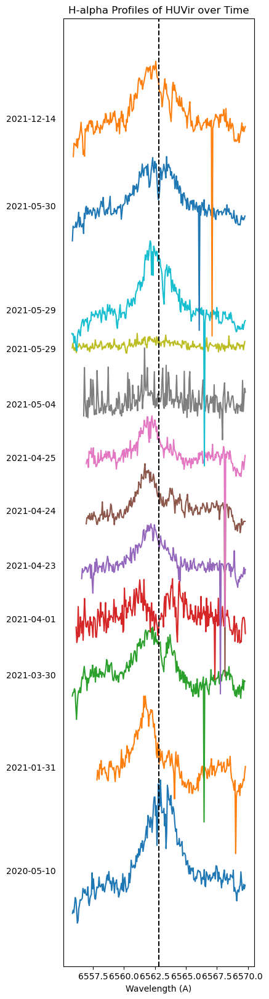

In [17]:
#Dates
x_base = 0
plt.figure(figsize = (4, 20))
plt.title("H-alpha Profiles of " + star + " over Time")
for i in range(len(specs)):
    #Finds Central RV:
    l_Ha = vel_to_wav(RVs[i], BVCORRs[i], l_ha)
    ha_spect = specs[i]
    ha_flux, ha_wav = filterer(o_ha, [l_Ha - 7, l_Ha + 7], ha_spect)
    
    #adjusts wavelengths
    ha_flux = ha_flux - ha_flux[0] + x_base
    ha_wav = ha_wav - (l_Ha - l_ha)
    #plot
    plt.plot(ha_wav, ha_flux)
    plt.text(6550.5, np.mean(ha_flux), date[i], va = 'top')
    x_base = max(ha_flux)
plt.axvline(l_ha, ls = '--', color = 'k')  
#plt.text(6558, 1, date[0], va = 'bottom')
#plt.axvline(l_Ha, ls = '-', color = 'blue')
plt.xlabel('Wavelength (A)')
plt.yticks([]) 

In [18]:
def phasing(period, times, t0):
    t0 = t0
    phase = (times - t0)/period %1
    return phase

In [19]:
phase = phasing(10.387678, BJDs, t0 = BJDs[3])

#print(phase)
phase_date = np.array([phase, date])

p_index = phase_date[0].argsort()
'''
for i in p_index:
    print(date[i],'\t', phase[i])
#print(phase)
'''

phase2 = phasing(10.387678, BJDs, t0 = 2449993.1950)
phase_date2 = np.array([phase2, date])

p_index2 = phase_date2[0].argsort()

#for i in p_index2:
    #print(date[i],'\t', phase2[i])
#print(phase)

In [20]:
for i in p_index2:
    print(i, date[i],'\t', phase2[i])


8 2021-05-29 	 0.07233876464067635
9 2021-05-29 	 0.07581882260865314
0 2020-05-10 	 0.11205120834370064
10 2021-05-30 	 0.17100500134290542
11 2021-12-14 	 0.2664944992185383
2 2021-03-30 	 0.3119931461164924
3 2021-04-01 	 0.5003790051008536
4 2021-04-23 	 0.6113446789523778
7 2021-05-04 	 0.6786928251713107
5 2021-04-24 	 0.7124941873429407
1 2021-01-31 	 0.7436650420752358
6 2021-04-25 	 0.8093702020502178


x_base = 0
plt.figure(figsize = (5, 20))
plt.title("H-alpha Profiles of " + star + ", t0 = " + str(BJDs[3]))
for i in p_index:
    #Finds Central RV:
    l_Ha = vel_to_wav(RVs[i], BVCORRs[i], l_ha)
    ha_spect = specs[i]
    ha_flux, ha_wav = filterer(o_ha, [l_Ha - 7, l_Ha + 7], ha_spect)
    #print(ha_wav[0])
    #adjusts wavelengths
    ha_flux = ha_flux - ha_flux[0] + x_base
    ha_wav = ha_wav - (l_Ha - l_ha)
    #plot
    plt.plot(ha_wav, ha_flux)
    plt.text(6556.30, np.mean(ha_flux), date[i] + " $\phi = $" + str(round(phase[i], 2)), va = 'top')
    x_base = max(ha_flux)
plt.axvline(l_ha, ls = '--', color = 'k')  
#plt.text(6558, 1, date[0], va = 'bottom')
#plt.axvline(l_Ha, ls = '-', color = 'blue')
plt.xlabel('Wavelength (A)')
plt.ylim(-300)
plt.yticks([]) 

x_base = 0
plt.figure(figsize = (5, 20))
plt.title("H-alpha Profiles of " + star + ", t0 = 2449993.1950")
for i in p_index2:
    #Finds Central RV:
    l_Ha = vel_to_wav(RVs[i], BVCORRs[i], l_ha)
    ha_spect = specs[i]
    ha_flux, ha_wav = filterer(o_ha, [l_Ha - 7, l_Ha + 7], ha_spect)
    #print(ha_wav[0])
    #adjusts wavelengths
    ha_flux = ha_flux - ha_flux[0] + x_base
    ha_wav = ha_wav - (l_Ha - l_ha)
    #plot
    plt.plot(ha_wav, ha_flux)
    plt.text(6556.30, np.mean(ha_flux), date[i] + " $\phi = $" + str(round(phase2[i], 2)), va = 'top')
    x_base = max(ha_flux)
plt.axvline(l_ha, ls = '--', color = 'k')  
#plt.text(6558, 1, date[0], va = 'bottom')
#plt.axvline(l_Ha, ls = '-', color = 'blue')
plt.xlabel('Wavelength (A)')
plt.ylim(-300)
plt.yticks([])

In [21]:
def phase_plot(period, times, t0, bound = 7, o_spec = o_ha, l_line = l_ha, 
               line_name = "H-alpha", RV_Mode = False, low_lim = None, x_place = l_ha - 6.5, 
               cent_rv = False, t0_label = 'periastron'):
    x_base = 0
    spec_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 
               'tab:gray', 'tab:olive', 'tab:cyan', 'teal', 'gold']
   
    #Calculating Phases
    phases = phasing(period, times, t0)
    phase_index =  np.array([phases, date])[0].argsort()
    
    
    #Plotting
    plt.figure(figsize = (5, 20))
    plt.title(line_name + " Profiles of " + star + r", $t_0$ = " + t0_label)
    if RV_Mode == True:
        x_place = velocity_spec(x_place, 0, l_line)
        l_cent = av_RV
        x_label = "Radial Velocity (km/s)"
    else: 
        x_place = x_place
        l_cent = l_line
        x_label = "Wavelength (A)"
        
        
        
    for i in phase_index:
        #Finds Central RV:
        l_Line = vel_to_wav(RVs[i], BVCORRs[i], l_line)
        l_spect = specs[i]
        l_flux, l_wav = filterer(o_spec, [l_Line - bound, l_Line + bound], l_spect)
        
        if RV_Mode == True:
            l_wav = velocity_spec(l_wav, BVCORRs[i], l_line)
            l_Line = RVs[i]
            
        #adjusts wavelengths
        l_flux = l_flux - l_flux[0] + x_base
        l_wav = l_wav - (l_Line - l_cent)
        if cent_rv == True:
            av_rv2 = av_RV - (l_Line - l_cent)
            plt.plot([av_rv2, av_rv2], (np.mean(l_flux) - 200, max(l_flux)), '-.', color = 'blue')
            #plot
        plt.plot(l_wav, l_flux, color = spec_colors[i])
        plt.text(x_place, np.mean(l_flux), date[i] + " $\phi = $" + str(round(phases[i], 2)), va = 'top')
        x_base = max(l_flux)
    plt.axvline(l_cent, ls = '--', color = 'k')  
    plt.xlabel(x_label)
    plt.ylim(low_lim)
    plt.yticks([])
    return plt

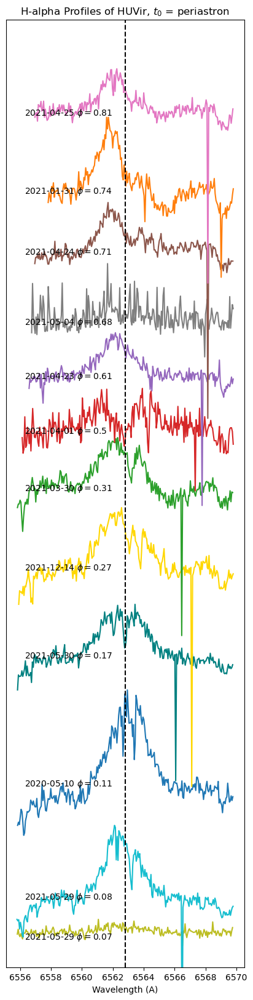

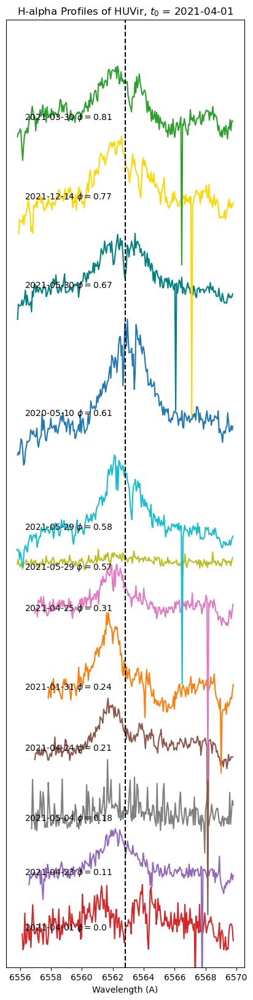

In [22]:
plt1 = phase_plot(10.387678, BJDs, t0 = 2449993.1950, x_place = 6556.30, low_lim = -300, t0_label = 'periastron')


plt2 = phase_plot(10.387678, BJDs, t0 = BJDs[3], x_place = 6556.30, low_lim = -300, t0_label = date[3])
#plt2.suptitle('H-alpha Profiles of ' + star + r', $t_0$ = 2021-04-01')
#plt2.tight_layout()
#plt1.subplots_adjust(top=0.96)

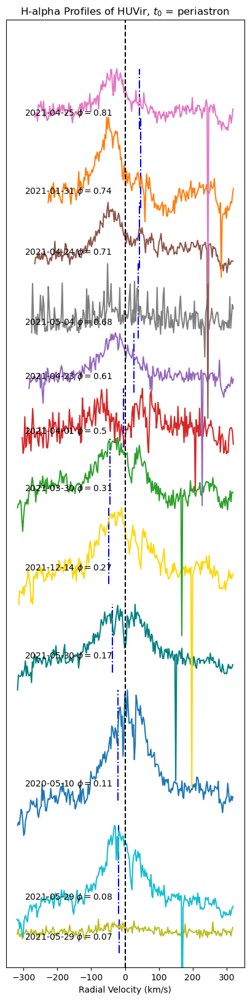

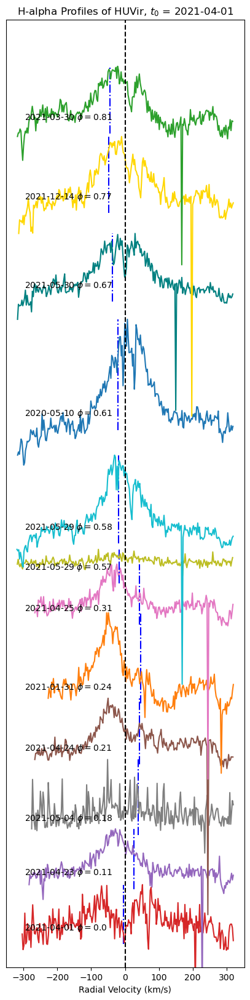

In [23]:
plt1 = phase_plot(10.387678, BJDs, t0 = 2449993.1950, x_place = 6556.30, low_lim = -300, RV_Mode = True, 
                  cent_rv = True, t0_label = 'periastron')
plt2 = phase_plot(10.387678, BJDs, t0 = BJDs[3], x_place = 6556.30, low_lim = -300, RV_Mode = True, 
                  cent_rv = True, t0_label = date[3])
#plt2 = phase_plot(10.387678, BJDs, t0 = BJDs[3], x_label = 6556.30, low_lim = -300)

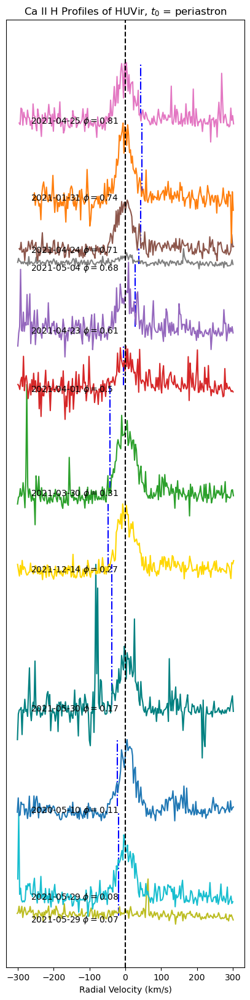

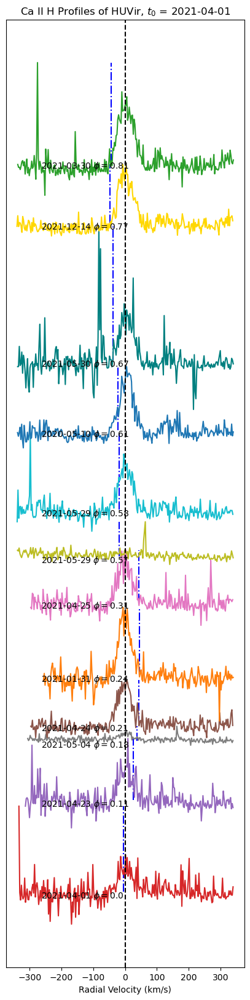

In [24]:
plt1 = phase_plot(10.387678, BJDs, t0 = 2449993.1950, o_spec = o_CaH, l_line = l_CaH, 
           line_name = 'Ca II H', bound = 4, x_place = l_CaH - 3.5, low_lim = None, RV_Mode = True, cent_rv = True)
plt2 = phase_plot(10.387678, BJDs, t0 = BJDs[3], bound = 4.5, o_spec = o_CaH, l_line = l_CaH, 
           line_name = 'Ca II H', x_place = l_CaH - 3.5, RV_Mode = True, cent_rv = True, t0_label = date[3])

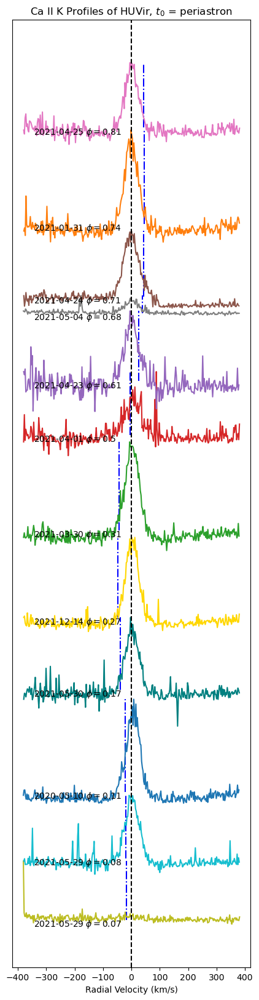

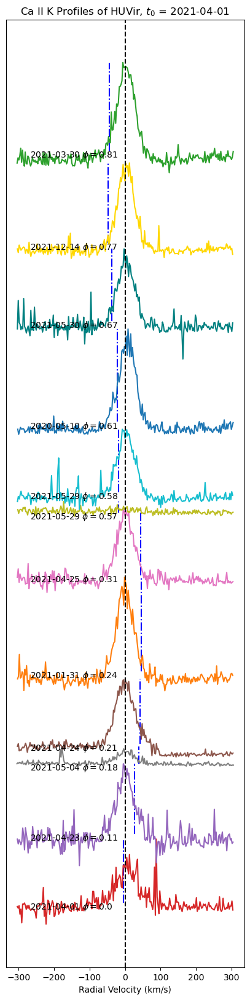

In [25]:
plt1 = phase_plot(10.387678, BJDs, t0 = 2449993.1950, o_spec = o_CaK, l_line = l_CaK, 
           line_name = 'Ca II K', bound = 5, x_place = l_CaK - 4.5, low_lim = None, RV_Mode = True, cent_rv = True)
plt2 = phase_plot(10.387678, BJDs, t0 = BJDs[3], bound = 4, o_spec = o_CaK, l_line = l_CaK, 
           line_name = 'Ca II K', x_place = l_CaK - 3.5, RV_Mode = True, cent_rv = True, t0_label = date[3])

print(velocity_spec(6556, 0 , l_ha), velocity_spec(6570, 0 , l_ha))

periastron_file = star + "_periastron.txt"

f = open(periastron_file, "a") 
print('#date', 'BJD', 'phase', file=f)
for i in p_index2:
    print(date[i], BJDs[i], phase2[i], file=f)

#file 2
eclipse_file = star + "_t0_eclipse.txt"
f = open(eclipse_file, "a") 
print('#date', 'BJD', 'phase', file=f)
for i in p_index:
    print(date[i], BJDs[i], phase[i], file=f)

# Profiles over Time, Phase

In [26]:
for i in range(len(date)):
    print(date[i], phase[i])

2020-05-10 0.6116722032428363
2021-01-31 0.2432860369743688
2021-03-30 0.8116141410155937
2021-04-01 0.0
2021-04-23 0.11096567385143619
2021-04-24 0.21211518224206483
2021-04-25 0.30899119694932153
2021-05-04 0.17831382007041974
2021-05-29 0.5719597595397614
2021-05-29 0.5754398175077373
2021-05-30 0.6706259962420145
2021-12-14 0.7661154941176029


In [27]:
BJDs_blueshift = BJDs
RVs_blueshift = np.array(RVs)
phase_blueshift = phase
phase_blueshift2 = phase2


print(BJDs_blueshift)
print(RVs_blueshift)

delete = [11, 10, 9, 8, 7, 3, 0]
for i in range(len(delete)):
    BJDs_blueshift = np.delete(BJDs_blueshift, delete[i])
    RVs_blueshift = np.delete(RVs_blueshift, delete[i])
    phase_blueshift = np.delete(phase_blueshift, delete[i])
    phase_blueshift2 = np.delete(phase_blueshift2, delete[i])
    #print(RVs_blueshift[delete[i]]

print(RVs_blueshift, BJDs_blueshift)

[2458979.70042187 2459245.953373   2459303.79537234 2459305.75226398
 2459327.68029567 2459328.73100419 2459329.73732104 2459338.76756453
 2459363.63198779 2459363.66813752 2459364.65690089 2459563.01469705]
[ 22.21 -45.38  44.3    5.43 -26.08 -42.38 -42.52 -37.58  18.78  19.72
  38.79  48.06]
[-45.38  44.3  -26.08 -42.38 -42.52] [2459245.953373   2459303.79537234 2459327.68029567 2459328.73100419
 2459329.73732104]


In [28]:
RVs_normal = np.array([RVs[0], RVs[9], RVs[10], RVs[11]])
BJDs_normal = np.array([BJDs[0], BJDs[9], BJDs[10], BJDs[11]])
phase_normal = np.array([phase[0], phase[9], phase[10], phase[11]])
phase2_normal = np.array([phase2[0], phase2[9], phase2[10], phase2[11]])

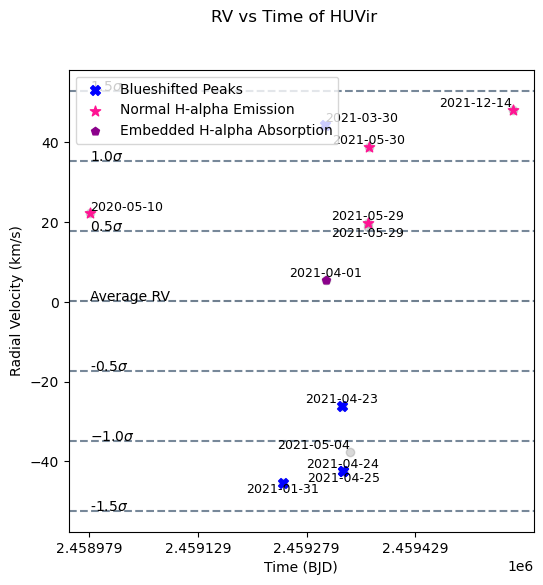

In [30]:
fig, ax = plt.subplots(1, figsize = (6, 6))

fig.suptitle("RV vs Time of " + star)
#ax.plot(est_time, est_orbit, label='Fitted sine curve', color = 'pink', ls = '--')
#ax.scatter(BJDs[0:12], RVs[0:12]) #'ko', ms = 3, mec = 'r')
ax.scatter(BJDs, RVs, alpha = 0.3, color = 'grey')


ax.scatter(BJDs_blueshift, RVs_blueshift, color = 'b', marker = 'X', s = 50, label = 'Blueshifted Peaks')
ax.scatter(BJDs_normal, RVs_normal, color = 'deeppink', marker = '*', s = 60, label = 'Normal H-alpha Emission')
ax.scatter(BJDs[3], RVs[3], color = 'darkmagenta', marker = 'p', label = 'Embedded H-alpha Absorption')

ax.axhline(av_RV, ls = '--', color = 'slategrey')#'g'), #label = 'Average RV')
ax.axhline(av_RV + RV_STD, ls = '--', color = 'lightslategrey') #'aquamarine')
ax.axhline(av_RV - RV_STD, ls = '--', color = 'lightslategrey')#'aquamarine')
ax.axhline(av_RV + 0.5*RV_STD, ls = '--', color = 'lightslategrey')#'springgreen')
ax.axhline(av_RV - 0.5*RV_STD, ls = '--', color = 'lightslategrey')#'springgreen')
ax.axhline(av_RV + 1.5*RV_STD, ls = '--', color = 'lightslategrey')#'cyan')
ax.axhline(av_RV - 1.5*RV_STD, ls = '--', color = 'lightslategrey')#'cyan')
'''
for i, label in enumerate(date[0:12]):
    #print(label)
    plt.text(BJDs[i], RVs[i], label, fontsize=9, ha='center', va = 'bottom')
'''

#Labels
ax.text(BJDs[0], RVs[0], date[0], fontsize=9, ha='left', va = 'bottom')
ax.text(BJDs[1], RVs[1], date[1], fontsize=9, ha='center', va = 'top')
ax.text(BJDs[2], RVs[2], date[2], fontsize=9, ha='left', va = 'bottom')
ax.text(BJDs[3], RVs[3], date[3], fontsize=9, ha='center', va = 'bottom')
ax.text(BJDs[4], RVs[4], date[4], fontsize=9, ha='center', va = 'bottom')
ax.text(BJDs[5], RVs[5], date[5], fontsize=9, ha='center', va = 'bottom')
ax.text(BJDs[6], RVs[6], date[6], fontsize=9, ha='center', va = 'top')
ax.text(BJDs[7], RVs[7], date[7], fontsize=9, ha='right', va = 'bottom')
ax.text(BJDs[8], RVs[8], date[8], fontsize=9, ha='center', va = 'top')
ax.text(BJDs[9], RVs[9], date[9], fontsize=9, ha='center', va = 'bottom')
ax.text(BJDs[10], RVs[10], date[10], fontsize=9, ha='center', va = 'bottom')
ax.text(BJDs[11], RVs[11], date[11], fontsize=9, ha='right', va = 'bottom')

#ax.text(0.5, 0.5, r'matplotlib')
#ax.text(5, av_RV, 'Average RV', fontsize=9, ha='center', va = 'bottom')
ax.text(BJDs[0], av_RV, r'Average RV', fontsize=10)#transform=ax.transAxes)
ax.text(BJDs[0], av_RV + 0.5*RV_STD, r'$0.5\sigma$', fontsize=10)
ax.text(BJDs[0], av_RV - 0.5*RV_STD, r'-$0.5\sigma$', fontsize=10)
ax.text(BJDs[0], av_RV + RV_STD, r'$1.0\sigma$', fontsize=10)
ax.text(BJDs[0], av_RV - RV_STD, r'$-1.0\sigma$', fontsize=10)
ax.text(BJDs[0], av_RV + 1.5*RV_STD, r'$1.5\sigma$', fontsize=10)
ax.text(BJDs[0], av_RV - 1.5*RV_STD, r'-$1.5\sigma$', fontsize=10)
ax.set_ylabel('Radial Velocity (km/s)')
ax.set_xlabel('Time (BJD)')
ax.set_xticks(np.arange(int(min(BJDs)), int(max(BJDs)) + 1, 150))
ax.legend(fontsize=10) #, bbox_to_anchor =(1.5,0.5), loc='lower right')
#fig.tight_layout()
#fig.subplots_adjust(top=0.95, right = 0.9)
#fig.savefig("RVvTime_HUVir.png", dpi = 300)

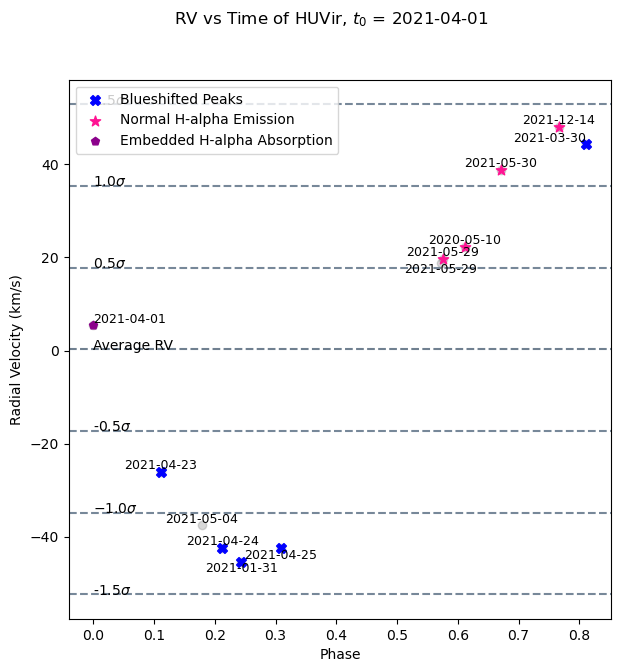

In [30]:
fig, ax = plt.subplots(1, figsize = (7, 7))

fig.suptitle("RV vs Time of " + star + r", $t_0$ = 2021-04-01")
#ax.plot(est_time, est_orbit, label='Fitted sine curve', color = 'pink', ls = '--')
#ax.scatter(BJDs[0:12], RVs[0:12]) #'ko', ms = 3, mec = 'r')
ax.scatter(phase, RVs, alpha = 0.3, color = 'grey')


ax.scatter(phase_blueshift, RVs_blueshift, color = 'b', marker = 'X', s = 50, label = 'Blueshifted Peaks')
ax.scatter(phase_normal, RVs_normal, color = 'deeppink', marker = '*', s = 60, label = 'Normal H-alpha Emission')
ax.scatter(phase[3], RVs[3], color = 'darkmagenta', marker = 'p', label = 'Embedded H-alpha Absorption')

ax.axhline(av_RV, ls = '--', color = 'slategrey')#'g'), #label = 'Average RV')
ax.axhline(av_RV + RV_STD, ls = '--', color = 'lightslategrey') #'aquamarine')
ax.axhline(av_RV - RV_STD, ls = '--', color = 'lightslategrey')#'aquamarine')
ax.axhline(av_RV + 0.5*RV_STD, ls = '--', color = 'lightslategrey')#'springgreen')
ax.axhline(av_RV - 0.5*RV_STD, ls = '--', color = 'lightslategrey')#'springgreen')
ax.axhline(av_RV + 1.5*RV_STD, ls = '--', color = 'lightslategrey')#'cyan')
ax.axhline(av_RV - 1.5*RV_STD, ls = '--', color = 'lightslategrey')#'cyan')
'''
ax.axhline(av_RV, ls = '--', color = 'g'), #label = 'Average RV')
ax.axhline(av_RV + RV_STD, ls = '--', color = 'aquamarine')
ax.axhline(av_RV - RV_STD, ls = '--', color = 'aquamarine')
ax.axhline(av_RV + 0.5*RV_STD, ls = '--', color = 'springgreen')
ax.axhline(av_RV - 0.5*RV_STD, ls = '--', color = 'springgreen')
ax.axhline(av_RV + 1.5*RV_STD, ls = '--', color = 'cyan')
ax.axhline(av_RV - 1.5*RV_STD, ls = '--', color = 'cyan')

for i, label in enumerate(date[0:12]):
    #print(label)
    plt.text(BJDs[i], RVs[i], label, fontsize=9, ha='center', va = 'bottom')
'''

#Labels
ax.text(phase[0], RVs[0], date[0], fontsize=9, ha='center', va = 'bottom')
ax.text(phase[1], RVs[1], date[1], fontsize=9, ha='center', va = 'top')
ax.text(phase[2], RVs[2], date[2], fontsize=9, ha='right', va = 'bottom')
ax.text(phase[3], RVs[3], date[3], fontsize=9, ha='left', va = 'bottom')
ax.text(phase[4], RVs[4], date[4], fontsize=9, ha='center', va = 'bottom')
ax.text(phase[5], RVs[5], date[5], fontsize=9, ha='center', va = 'bottom')
ax.text(phase[6], RVs[6], date[6], fontsize=9, ha='center', va = 'top')
ax.text(phase[7], RVs[7], date[7], fontsize=9, ha='center', va = 'bottom')
ax.text(phase[8], RVs[8], date[8], fontsize=9, ha='center', va = 'top')
ax.text(phase[9], RVs[9], date[9], fontsize=9, ha='center', va = 'bottom')
ax.text(phase[10], RVs[10], date[10], fontsize=9, ha='center', va = 'bottom')
ax.text(phase[11], RVs[11], date[11], fontsize=9, ha='center', va = 'bottom')

#ax.text(0.5, 0.5, r'matplotlib')
#ax.text(5, av_RV, 'Average RV', fontsize=9, ha='center', va = 'bottom')
ax.text(phase[3], av_RV, r'Average RV', fontsize=10)#transform=ax.transAxes)
ax.text(phase[3], av_RV + 0.5*RV_STD, r'$0.5\sigma$', fontsize=10)
ax.text(phase[3], av_RV - 0.5*RV_STD, r'-$0.5\sigma$', fontsize=10)
ax.text(phase[3], av_RV + RV_STD, r'$1.0\sigma$', fontsize=10)
ax.text(phase[3], av_RV - RV_STD, r'$-1.0\sigma$', fontsize=10)
ax.text(phase[3], av_RV + 1.5*RV_STD, r'$1.5\sigma$', fontsize=10)
ax.text(phase[3], av_RV - 1.5*RV_STD, r'-$1.5\sigma$', fontsize=10)
ax.set_ylabel('Radial Velocity (km/s)')
ax.set_xlabel('Phase')
#ax.set_xticks(np.arange(int(min(phase)), int(max(phase)) + 1, 150))
ax.legend(fontsize=10) #, bbox_to_anchor =(1.5,0.5), loc='lower right')
#fig.tight_layout()
#fig.subplots_adjust(top=0.95, right = 0.9)
#fig.savefig("RVvTime_HUVir.png", dpi = 300)


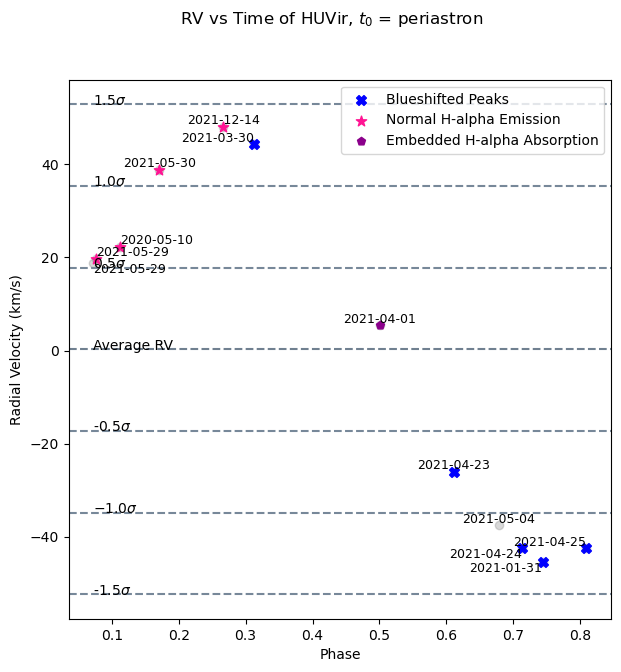

In [33]:
fig, ax = plt.subplots(1, figsize = (7, 7))

fig.suptitle("RV vs Time of " + star + r", $t_0$ = periastron")
#ax.plot(est_time, est_orbit, label='Fitted sine curve', color = 'pink', ls = '--')
#ax.scatter(BJDs[0:12], RVs[0:12]) #'ko', ms = 3, mec = 'r')
ax.scatter(phase2, RVs, alpha = 0.3, color = 'grey')


ax.scatter(phase_blueshift2, RVs_blueshift, color = 'b', marker = 'X', s = 50, label = 'Blueshifted Peaks')
ax.scatter(phase2_normal, RVs_normal, color = 'deeppink', marker = '*', s = 60, label = 'Normal H-alpha Emission')
ax.scatter(phase2[3], RVs[3], color = 'darkmagenta', marker = 'p', label = 'Embedded H-alpha Absorption')

ax.axhline(av_RV, ls = '--', color = 'slategrey')#'g'), #label = 'Average RV')
ax.axhline(av_RV + RV_STD, ls = '--', color = 'lightslategrey') #'aquamarine')
ax.axhline(av_RV - RV_STD, ls = '--', color = 'lightslategrey')#'aquamarine')
ax.axhline(av_RV + 0.5*RV_STD, ls = '--', color = 'lightslategrey')#'springgreen')
ax.axhline(av_RV - 0.5*RV_STD, ls = '--', color = 'lightslategrey')#'springgreen')
ax.axhline(av_RV + 1.5*RV_STD, ls = '--', color = 'lightslategrey')#'cyan')
ax.axhline(av_RV - 1.5*RV_STD, ls = '--', color = 'lightslategrey')#'cyan')
'''
ax.axhline(av_RV, ls = '--', color = 'g'), #label = 'Average RV')
ax.axhline(av_RV + RV_STD, ls = '--', color = 'aquamarine')
ax.axhline(av_RV - RV_STD, ls = '--', color = 'aquamarine')
ax.axhline(av_RV + 0.5*RV_STD, ls = '--', color = 'springgreen')
ax.axhline(av_RV - 0.5*RV_STD, ls = '--', color = 'springgreen')
ax.axhline(av_RV + 1.5*RV_STD, ls = '--', color = 'cyan')
ax.axhline(av_RV - 1.5*RV_STD, ls = '--', color = 'cyan')

'''

#Labels
ax.text(phase2[0], RVs[0], date[0], fontsize=9, ha='left', va = 'bottom')
ax.text(phase2[1], RVs[1], date[1], fontsize=9, ha='right', va = 'top')
ax.text(phase2[2], RVs[2], date[2], fontsize=9, ha='right', va = 'bottom')
ax.text(phase2[3], RVs[3], date[3], fontsize=9, ha='center', va = 'bottom')
ax.text(phase2[4], RVs[4], date[4], fontsize=9, ha='center', va = 'bottom')
ax.text(phase2[5], RVs[5], date[5], fontsize=9, ha='right', va = 'top')
ax.text(phase2[6], RVs[6], date[6], fontsize=9, ha='right', va = 'bottom')
ax.text(phase2[7], RVs[7], date[7], fontsize=9, ha='center', va = 'bottom')
ax.text(phase2[8], RVs[8], date[8], fontsize=9, ha='left', va = 'top')
ax.text(phase2[9], RVs[9], date[9], fontsize=9, ha='left', va = 'bottom')
ax.text(phase2[10], RVs[10], date[10], fontsize=9, ha='center', va = 'bottom')
ax.text(phase2[11], RVs[11], date[11], fontsize=9, ha='center', va = 'bottom')

#ax.text(0.5, 0.5, r'matplotlib')
#ax.text(5, av_RV, 'Average RV', fontsize=9, ha='center', va = 'bottom')
ax.text(phase2[8], av_RV, r'Average RV', fontsize=10)#transform=ax.transAxes)
ax.text(phase2[8], av_RV + 0.5*RV_STD, r'$0.5\sigma$', fontsize=10)
ax.text(phase2[8], av_RV - 0.5*RV_STD, r'-$0.5\sigma$', fontsize=10)
ax.text(phase2[8], av_RV + RV_STD, r'$1.0\sigma$', fontsize=10)
ax.text(phase2[8], av_RV - RV_STD, r'$-1.0\sigma$', fontsize=10)
ax.text(phase2[8], av_RV + 1.5*RV_STD, r'$1.5\sigma$', fontsize=10)
ax.text(phase2[8], av_RV - 1.5*RV_STD, r'-$1.5\sigma$', fontsize=10)
ax.set_ylabel('Radial Velocity (km/s)')
ax.set_xlabel('Phase')
#ax.set_xticks(np.arange(int(min(phase)), int(max(phase)) + 1, 150))
ax.legend(fontsize=10) #, bbox_to_anchor =(1.5,0.5), loc='lower right')
#fig.tight_layout()
#fig.subplots_adjust(top=0.95, right = 0.9)
#fig.savefig("RVvTime_HUVir.png", dpi = 300)

# H-alpha Spectra

In [34]:
### Additional Fits
flux_Ha4, wavelength_Ha4 = filterer(o_ha, lims_ha[3], spec4)
popt_Ha4, pcov_Ha4 = scipy.optimize.curve_fit(gauss, wavelength_Ha4, flux_Ha4,guesses_ha[3])
fit_flux_Ha4 = gauss(wavelength_Ha4, popt_Ha4[0], popt_Ha4[1], popt_Ha4[2], popt_Ha4[3])

flux_Ha4b, wavelength_Ha4b = filterer(o_ha, lims_ha[4], spec4)
popt_Ha4b, pcov_Ha4b = scipy.optimize.curve_fit(gauss, wavelength_Ha4b, flux_Ha4b, guesses_ha[4])
fit_flux_Ha4b = gauss(wavelength_Ha4b, popt_Ha4b[0], popt_Ha4b[1], popt_Ha4b[2], popt_Ha4b[3])

flux_Ha2, wavelength_Ha2 = filterer(o_ha, [6562,6565], spec2)
popt_Ha2, pocv_Ha2 = scipy.optimize.curve_fit(gauss, wavelength_Ha2, flux_Ha2,[200, 6564,1, 2230])
fit_flux_Ha2 = gauss(wavelength_Ha2, popt_Ha2[0], popt_Ha2[1], popt_Ha2[2], popt_Ha2[3])

fit_flux_Ha4_1, wavelength_Ha4_1 = adjust_bounds(wavelength_Ha4, fit_flux_Ha4, [6562.42, lims_ha[3][1]])
fit_flux_Ha4b_1, wavelength_Ha4b_1 = adjust_bounds(wavelength_Ha4b, fit_flux_Ha4b, [lims_ha[3][0], 6562.42])

v_Ha4_1 = velocity_spec(wavelength_Ha4_1, BVCORRs[3], l_ha)
v_Ha4b_1 = velocity_spec(wavelength_Ha4b_1, BVCORRs[3], l_ha)
v_Ha2_1 = velocity_spec(popt_Ha2[1], BVCORRs[1], l_ha)

#fit_flux2_1 = adjust_bounds(wavelength)



fig,ax = plt.subplots(6, 2, figsize=(20,42))
fig.suptitle('Fitted H-alpha Spectrum of ' + star, fontsize = 40)

plt_spec(spec12, 11, l_ha, o_ha, lims_ha[10], guesses_ha[10], ax, plt_place = [0,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = True, ylims = [1700, 'none'])#, xlims = [-200, 200])

plt_spec(spec3, 2, l_ha, o_ha, lims_ha[2], guesses_ha[2], ax, plt_place = [0,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Blueshifted Peaks", plt_gauss = True, ylims = [1900, 'none'])#, xlims = [-200, 200])

plt_spec(spec11, 10, l_ha, o_ha, lims_ha[9], guesses_ha[9], ax, plt_place = [1,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = True, ylims = [900, 'none'])#, xlims = [-200, 200])

plt_spec(spec, 0, l_ha, o_ha, lims_ha[0], guesses_ha[0], ax, plt_place = [1,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = True)#, xlims = [-200, 200])

plt_spec(spec10, 9, l_ha, o_ha, lims_ha[8], guesses_ha[8], ax, plt_place = [2,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = True, ylims = [1000, 'none'])#, xlims = [-200, 200])

plt_spec(spec9, 8, l_ha, o_ha, [6556, 6574], [352.871, 6562.03, 1, 386.249], ax, plt_place = [2,1], 
         l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Bad Data", plt_gauss = True) 
         #xlims = [-200, 200], ylims = ['none', 2000])

plt_spec(spec4, 3, l_ha, o_ha, lims_ha[3], guesses_ha[3], ax, plt_place = [3,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,  
         line_class = "Embedded H-alpha Absorption", plt_gauss = False, ylims = [900, 'none']) #, xlims = [-200, 200])

ax[3][0].plot(v_Ha4_1, fit_flux_Ha4_1, color = fit_color, lw = 3)
ax[3][0].plot(v_Ha4b_1, fit_flux_Ha4b_1, color = fit_color, lw = 3)

plt_spec(spec5, 4, l_ha, o_ha, lims_ha[5], guesses_ha[5], ax, plt_place = [3,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,  
         line_class = "Blueshifted Peaks", plt_gauss = True) #, xlims = [-200, 200])

plt_spec(spec8, 7, l_ha, o_ha, [6556, 6568], guesses_ha[8], ax, plt_place = [4,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Bad Data", plt_gauss = True) #, xlims = [-200, 200])

plt_spec(spec6, 5, l_ha, o_ha, lims_ha[6], guesses_ha[6], ax, plt_place = [4,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
        line_class = "Blueshifted Peaks", plt_gauss = True) #, xlims = [-200, 200])

plt_spec(spec7, 6, l_ha, o_ha, lims_ha[7], guesses_ha[7], ax, plt_place = [5,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Blueshifted Peaks", plt_gauss = True) #, xlims = [-200, 200])

plt_spec(spec2, 1, l_ha, o_ha, lims_ha[1], guesses_ha[1], ax, plt_place = [5,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, peak_col = peak_color,
        line_class = "Blueshifted Peaks", plt_peak = True, RV_Mode = True) #, xlims = [-200, 200])
#ax[5,1].plot(v_Ha2_1, fit_flux_Ha2, color = fit_color, lw=3)
ax[5,1].axvline(v_Ha2_1, color = peak_color, ls = ':', lw = 4)


fig.tight_layout()
fig.subplots_adjust(top=0.95)
#fig.savefig("Unfitted_H-alpha_RV_profiles_HUVir.png", dpi = 300)


Pair with broadening Function

Individual H-alpha Plots 


fig03 = plt_spec(spec3, 2, l_ha, o_ha, lims_ha[2], guesses_ha[2], ax, plt_place = [None,None],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, peak_col = peak_color,
         line_class = "Blueshifted Peaks", plt_peak = True, ylims = [1900, 'none'])#, xlims = [-200, 200])

fig02 = plt_spec(spec11, 10, l_ha, o_ha, lims_ha[9], guesses_ha[9], ax, plt_place = [None,None],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = False, ylims = [900, 'none'])#, xlims = [-200, 200])

fig01 = plt_spec(spec, 0, l_ha, o_ha, lims_ha[0], guesses_ha[0], ax, plt_place = [None,None],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = False)#, xlims = [-200, 200])

fig05 = plt_spec(spec4, 3, l_ha, o_ha, lims_ha[3], guesses_ha[3], ax, plt_place = [None,None],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,  
         line_class = "Embedded H-alpha Absorption", plt_gauss = False, ylims = [900, 'none']) #, xlims = [-200, 200])

fig06 = plt_spec(spec5, 4, l_ha, o_ha, lims_ha[5], guesses_ha[5], ax, plt_place = [None,None],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, peak_col = peak_color,  
         line_class = "Blueshifted Peaks", plt_peak = True) #, xlims = [-200, 200])

fig07 = plt_spec(spec6, 5, l_ha, o_ha, lims_ha[6], guesses_ha[6], ax, plt_place = [None,None],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, peak_col = peak_color, gauss_col = fit_color,
        line_class = "Blueshifted Peaks", plt_peak = True) #, xlims = [-200, 200])

fig08 = plt_spec(spec7, 6, l_ha, o_ha, lims_ha[7], guesses_ha[7], ax, plt_place = [None,None],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, peak_col = peak_color,gauss_col = fit_color,
         line_class = "Blueshifted Peaks", plt_gauss = False, plt_peak = True) #, xlims = [-200, 200])

fig.tight_layout()
fig.subplots_adjust(top=0.95)



fig_list = [fig03, fig01, fig05, fig06, fig07, fig08]

for i in range(len(fig_list)):
    #fig_name = 'fig0' + int() + '.png'
    #fig_list[i].savefig()
    pass

In [38]:
for i in p_index2:
    print(i, date[i],'\t', phase2[i])

8 2021-05-29 	 0.07233876464067635
9 2021-05-29 	 0.07581882260865314
0 2020-05-10 	 0.11205120834370064
10 2021-05-30 	 0.17100500134290542
11 2021-12-14 	 0.2664944992185383
2 2021-03-30 	 0.3119931461164924
3 2021-04-01 	 0.5003790051008536
4 2021-04-23 	 0.6113446789523778
7 2021-05-04 	 0.6786928251713107
5 2021-04-24 	 0.7124941873429407
1 2021-01-31 	 0.7436650420752358
6 2021-04-25 	 0.8093702020502178


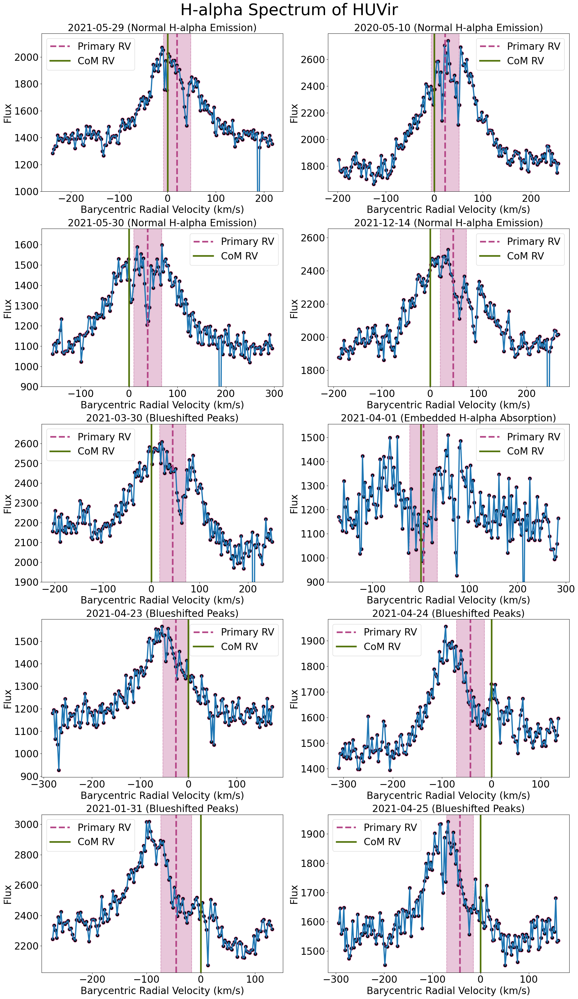

In [41]:
fig,ax = plt.subplots(5, 2, figsize=(20,35))
fig.suptitle('H-alpha Spectrum of ' + star, fontsize = 40)

plt_spec(spec10, 9, l_ha, o_ha, lims_ha[8], guesses_ha[8], ax, plt_place = [0,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = False, ylims = [1000, 'none'])#, xlims = [-200, 200])

plt_spec(spec, 0, l_ha, o_ha, lims_ha[0], guesses_ha[0], ax, plt_place = [0,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = False)#, xlims = [-200, 200])

plt_spec(spec11, 10, l_ha, o_ha, lims_ha[9], guesses_ha[9], ax, plt_place = [1,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = False, ylims = [900, 'none'])#, xlims = [-200, 200])

plt_spec(spec12, 11, l_ha, o_ha, lims_ha[10], guesses_ha[10], ax, plt_place = [1,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Normal H-alpha Emission", plt_gauss = False, ylims = [1700, 'none'])#, xlims = [-200, 200])

plt_spec(spec3, 2, l_ha, o_ha, lims_ha[2], guesses_ha[2], ax, plt_place = [2,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Blueshifted Peaks", plt_gauss = False, ylims = [1900, 'none'])#, xlims = [-200, 200])

plt_spec(spec4, 3, l_ha, o_ha, lims_ha[3], guesses_ha[3], ax, plt_place = [2,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,  
         line_class = "Embedded H-alpha Absorption", plt_gauss = False, ylims = [900, 'none']) #, xlims = [-200, 200])

plt_spec(spec5, 4, l_ha, o_ha, lims_ha[5], guesses_ha[5], ax, plt_place = [3,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,  
         line_class = "Blueshifted Peaks", plt_gauss = False) #, xlims = [-200, 200])

plt_spec(spec6, 5, l_ha, o_ha, lims_ha[6], guesses_ha[6], ax, plt_place = [3,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
        line_class = "Blueshifted Peaks", plt_gauss = False) #, xlims = [-200, 200])

plt_spec(spec2, 1, l_ha, o_ha, lims_ha[1], guesses_ha[1], ax, plt_place = [4,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
        line_class = "Blueshifted Peaks", plt_gauss = False) #, xlims = [-200, 200])

plt_spec(spec7, 6, l_ha, o_ha, lims_ha[7], guesses_ha[7], ax, plt_place = [4,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, gauss_col = fit_color,
         line_class = "Blueshifted Peaks", plt_gauss = False) #, xlims = [-200, 200])


fig.tight_layout()
fig.subplots_adjust(top=0.95)
#fig.savefig("Unfitted_H-alpha_RV_profiles_HUVir.png", dpi = 300)

# Ploting Ca H + K Lines

Ca + H

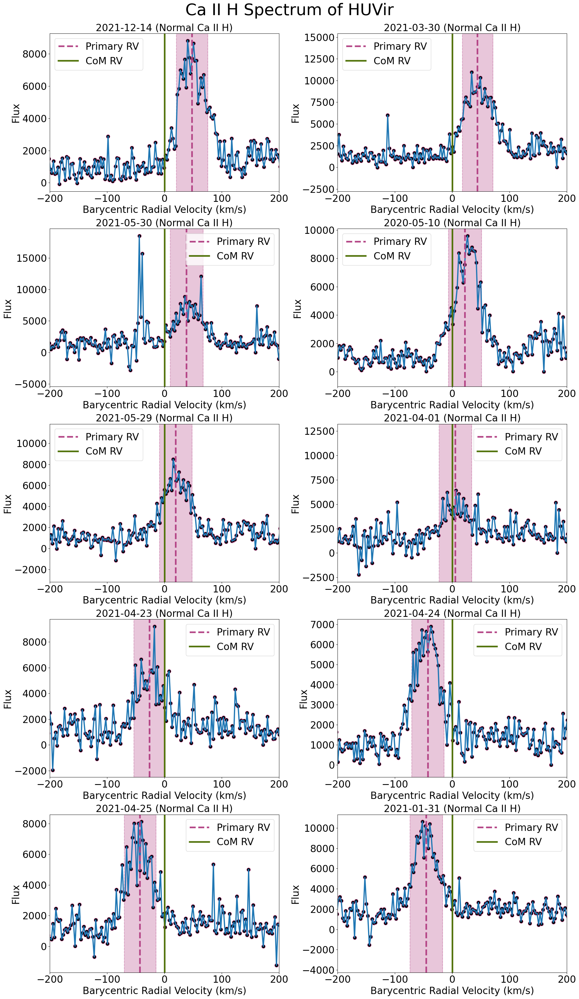

In [42]:
fig2,ax = plt.subplots(5, 2, figsize=(20,35))
fig2.suptitle('Ca II H Spectrum of ' + star, fontsize = 40)

plt_spec(spec12, 11, l_CaH, o_CaH, lims_CaH[11], guesses_CaH[11], ax, plt_place = [0,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec3, 2, l_CaH, o_CaH, lims_CaH[2], guesses_CaH[2], ax, plt_place = [0,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False , xlims = [-200, 200])

plt_spec(spec11, 10, l_CaH, o_CaH, lims_CaH[10], guesses_CaH[10], ax, plt_place = [1,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False , xlims = [-200, 200])

plt_spec(spec, 0, l_CaH, o_CaH, lims_CaH[0], guesses_CaH[0], ax, plt_place = [1,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec10, 9, l_CaH, o_CaH, lims_CaH[9], guesses_CaH[9], ax, plt_place = [2,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])


plt_spec(spec4, 3, l_CaH, o_CaH, lims_CaH[3], guesses_CaH[3], ax, plt_place = [2,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec5, 4, l_CaH, o_CaH, lims_CaH[4], guesses_CaH[4], ax, plt_place = [3,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec6, 5, l_CaH, o_CaH, lims_CaH[5], guesses_CaH[5], ax, plt_place = [3,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec7, 6, l_CaH, o_CaH, lims_CaH[6], guesses_CaH[6], ax, plt_place = [4,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec2, 1, l_CaH, o_CaH, lims_CaH[1], guesses_CaH[1], ax, plt_place = [4,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II H", plt_gauss = False, xlims = [-200, 200])
fig2.tight_layout()
fig2.subplots_adjust(top=0.95)

#fig2.savefig("Unfitted_CaH_RV_profiles_HUVir.png", dpi = 300)

Ca+K

fig,ax = plt.subplots(6, 2, figsize=(20,42))
fig.suptitle('Ca II K Spectrum of ' + star, fontsize = 40)

plt_spec(spec12, 11, l_CaK, o_CaK, lims_CaK[11], guesses_CaK[11], ax, plt_place = [0,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec3, 2, l_CaK, o_CaK, lims_CaK[2], guesses_CaK[2], ax, plt_place = [0,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec11, 10, l_CaK, o_CaK, lims_CaK[10], guesses_CaK[10], ax, plt_place = [1,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec, 0, l_CaK, o_CaK, lims_CaK[0], guesses_CaK[0], ax, plt_place = [1,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec10, 9, l_CaK, o_CaK, lims_CaK[9], guesses_CaK[9], ax, plt_place = [2,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec9, 8, l_CaK, o_CaK, lims_CaK[8], guesses_CaK[8], ax, plt_place = [2,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, 
         xlims = [-200, 200], ylims = ['none', 2000])

plt_spec(spec4, 3, l_CaK, o_CaK, lims_CaK[3], guesses_CaK[3], ax, plt_place = [3,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec5, 4, l_CaK, o_CaK, lims_CaK[4], guesses_CaK[4], ax, plt_place = [3,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec8, 7, l_CaK, o_CaK, lims_CaK[7], guesses_CaK[7], ax, plt_place = [4,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec6, 5, l_CaK, o_CaK, lims_CaK[5], guesses_CaK[5], ax, plt_place = [4,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec7, 6, l_CaK, o_CaK, lims_CaK[6], guesses_CaK[6], ax, plt_place = [5,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

plt_spec(spec2, 1, l_CaK, o_CaK, lims_CaK[1], guesses_CaK[1], ax, plt_place = [5,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = True, xlims = [-200, 200])

fig.tight_layout()
fig.subplots_adjust(top=0.95)
#fig.savefig("Unfitted_H-alpha_RV_profiles_HUVir.png", dpi = 300)

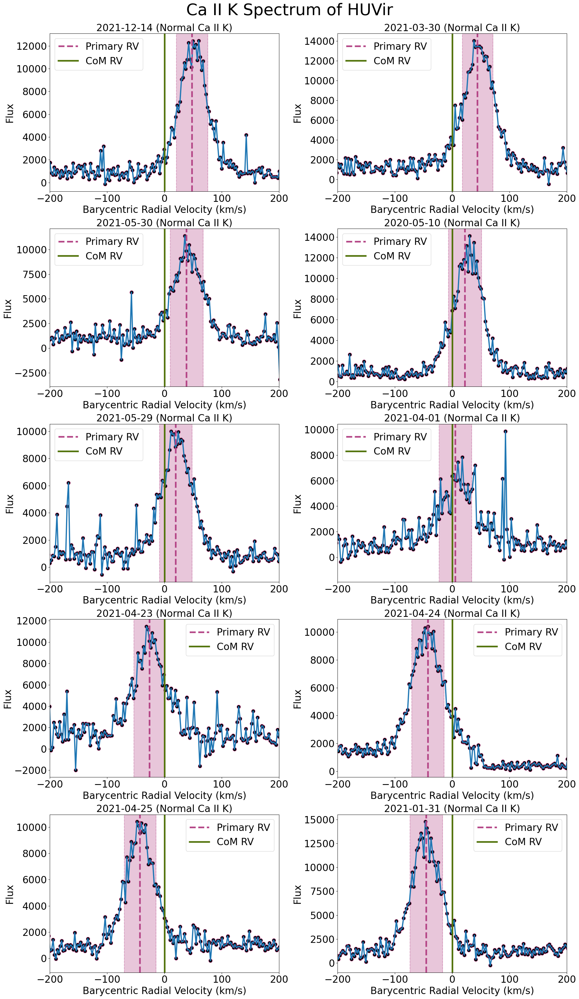

In [43]:
fig,ax = plt.subplots(5, 2, figsize=(20,35))
fig.suptitle('Ca II K Spectrum of ' + star, fontsize = 40)

plt_spec(spec12, 11, l_CaK, o_CaK, lims_CaK[11], guesses_CaK[11], ax, plt_place = [0,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec3, 2, l_CaK, o_CaK, lims_CaK[2], guesses_CaK[2], ax, plt_place = [0,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec11, 10, l_CaK, o_CaK, lims_CaK[10], guesses_CaK[10], ax, plt_place = [1,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec, 0, l_CaK, o_CaK, lims_CaK[0], guesses_CaK[0], ax, plt_place = [1,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec10, 9, l_CaK, o_CaK, lims_CaK[9], guesses_CaK[9], ax, plt_place = [2,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec4, 3, l_CaK, o_CaK, lims_CaK[3], guesses_CaK[3], ax, plt_place = [2,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec5, 4, l_CaK, o_CaK, lims_CaK[4], guesses_CaK[4], ax, plt_place = [3,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])
plt_spec(spec6, 5, l_CaK, o_CaK, lims_CaK[5], guesses_CaK[5], ax, plt_place = [3,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec7, 6, l_CaK, o_CaK, lims_CaK[6], guesses_CaK[6], ax, plt_place = [4,0],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

plt_spec(spec2, 1, l_CaK, o_CaK, lims_CaK[1], guesses_CaK[1], ax, plt_place = [4,1],
        l_col = line_color, CoM_col = CoM_color, spec_col = wav_color, 
         line_class = "Normal Ca II K", plt_gauss = False, xlims = [-200, 200])

fig.tight_layout()
fig.subplots_adjust(top=0.95)
#fig.savefig("Unfitted_CaK_profiles_HUVir.png", dpi = 300)

# Ca II H&K Individual Plots

In [44]:
def ind_autopilot(l_line, o_line, phase_names, rv_indexes, line_name = '', ran=5):
    if (len(phase_names) != len(rv_indexes)):
        print('Error')
        pass
    for j in range(len(rv_indexes)): #[11, 2, 10, 0, 9, 3, 4, 5, 6, 1]:#(rvs_index):
        lshift = vel_to_wav(RVs[rv_indexes[j]], BVCORRs[rv_indexes[j]], l_line)
        line_lims = [lshift - ran, lshift + ran]
        figure = plt_spec(specs[rv_indexes[j]], rv_indexes[j], l_line, o_line, line_lims, -1, ax, plt_place = [None,None], 
                      l_col = line_color, CoM_col = CoM_color, spec_col = wav_color , gauss_col = fit_color,
                      xlims = ['none', 'none'], ylims= ['none', 'none'], line_class = None,
                      RV_Mode = True, plt_gauss = False, plt_sec = False);
        fig_name = line_name +'_'+ 'fig0' + str(phase_names[j]) + '.png'
        #fig_path = 
        #print(fig_name)
        #figure.savefig(fig_name)

In [45]:
index_list = [2,10,0,3,4,5,6]
phase_list = [3,2,1,5,6,7,8]

In [46]:
#ind_autopilot(l_CaH, o_CaH, phase_names = phase_list, rv_indexes = index_list, line_name = 'CaIIH', ran=5)

In [47]:
#ind_autopilot(l_CaK, o_CaK, phase_names = phase_list, rv_indexes = index_list, line_name = 'CaIIK', ran=5)

# Hydrogen Beta, Gamma, Delta

In [48]:
def line_autoplot(l_line, o_line, line_name = '', addclasses = False, classes = [''], ran=5):
    fig, ax = plt.subplots(6, 2, figsize = (20, 42))
    fig.suptitle(line_name + " Spectrum " + star, fontsize = 40)
    rows = 0
    num_cols = 1
    cols = 0
    for j in rvs_index: #[11, 2, 10, 0, 9, 3, 4, 5, 6, 1]:#(rvs_index):
        k = 0
        if addclasses == True:
            lspec_class = classes[k]
            k = k+1
        else:
            lspec_class = None
        lshift = vel_to_wav(RVs[j], BVCORRs[j], l_line)
        line_lims = [lshift - ran, lshift + ran]
        plt_spec(specs[j], j, l_line, o_line, line_lims, -1, ax, plt_place = [rows,cols], 
                      l_col = line_color, CoM_col = CoM_color, spec_col = wav_color , gauss_col = fit_color,
                      xlims = ['none', 'none'], ylims= ['none', 'none'], line_class = lspec_class,
                      RV_Mode = True, plt_gauss = False, plt_sec = False);
        if (cols == num_cols):
            cols = 0
            rows = rows + 1
        else:
            cols = cols + 1
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    return fig, ax

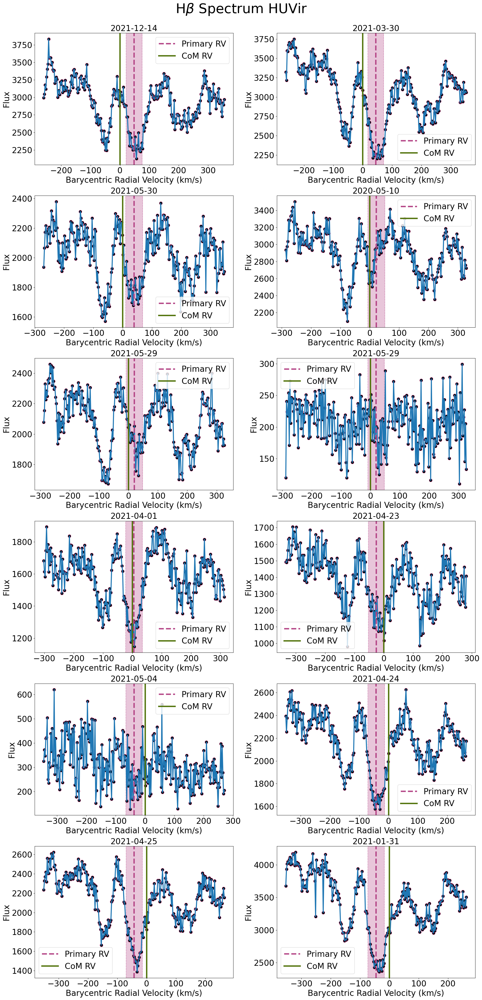

In [49]:
#plotting h_beta:
fig, ax = line_autoplot(l_hb, o_hb, 'H' + r'$\beta$')

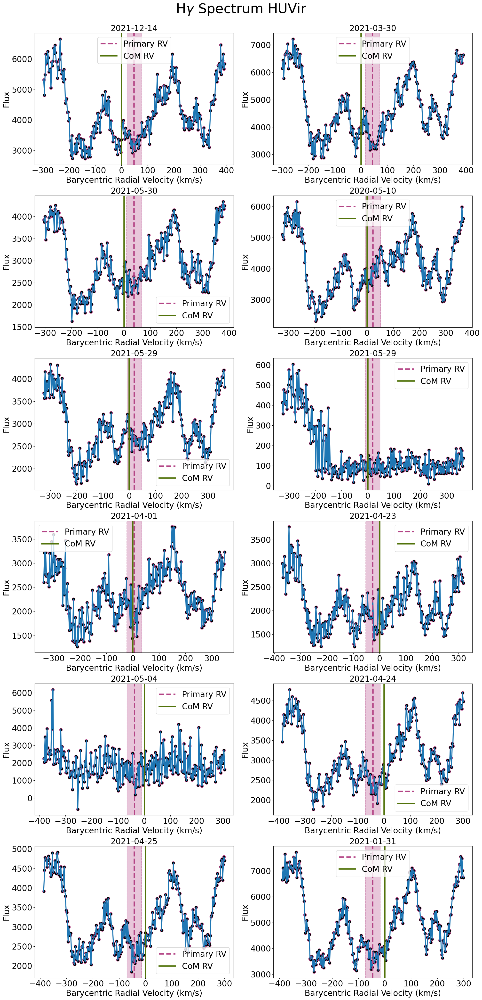

In [50]:
#plotting h_gamma
fig, ax = line_autoplot(l_hy, o_hy, 'H' + r'$\gamma$')

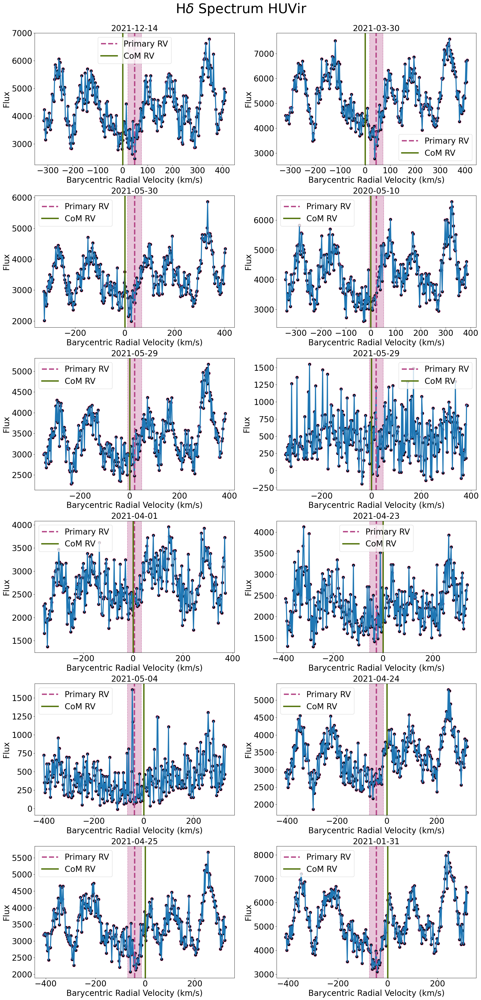

In [51]:
fig, ax = line_autoplot(l_Hd, o_Hd, 'H' + r'$\delta$')

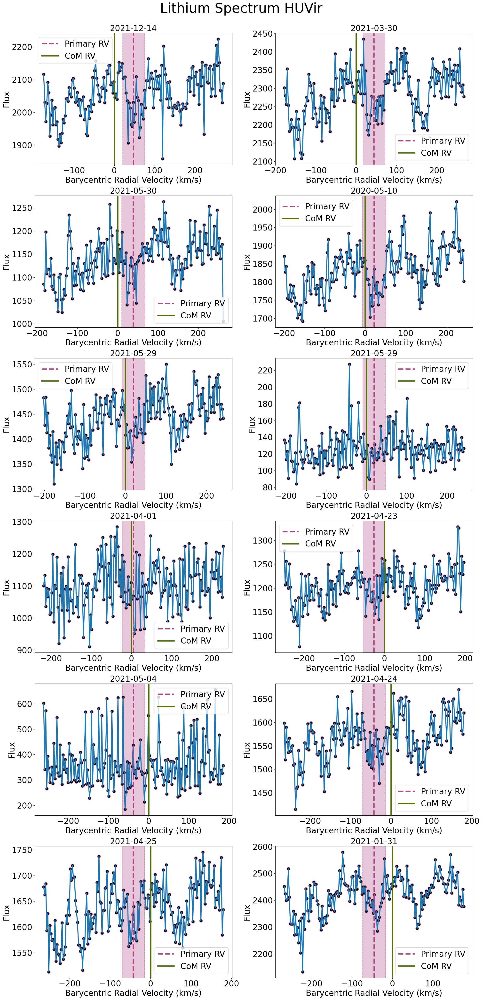

In [52]:
fig, ax = line_autoplot(l_Li, o_Li, 'Lithium')

'''
for i in range(58):
    fig, ax = plt.subplots()
    ax.plot(spec['wav'][i],spec['flux'][i], label = date[0])
#ax[0].plot([l_ha, l_ha], (min(spec['flux'][o_ha]), max(spec['flux'][o_ha])), '--')
    ax.set_ylabel('Flux')
    ax.legend()
'''

# Velocity Parameters

In [55]:
import pandas as pd
from IPython.display import display, Latex

In [56]:
peak_diffs = np.array([['2021-01-31', -93.44590182566512, -48.065901825665115],['2021-03-30', 16.06340367512046, -28.23659632487954], 
 ['2021-04-23',-54.51642283423456, -28.436422834234563],
['2021-04-24', -81.73121811779767,-39.351218117797664],
['2021-04-25', -76.74441480722871,-34.224414807228705]])

In [57]:
#T_0 = 2287.709475 #(+/-0.001278)
#P = 10.39 #(+/-0.001545)
radius_ratio = 0.128146 #(+/-0.000535) R2/R1
a_to_R_ratio = 3.540496 #(+/-0.055938) a/(R_1+R_2) 
inc = 85.385674 #(+/-0.735174)
J_ratio = 1.509413 #(+/-0.013928) J2/J1

rot_period = 10.387678 #days

$P^2 = \frac{4\pi^2}{GM_{tot}} a^3$

$M_{tot} = \frac{4\pi^2}{GP^2} a^3$, $P = \frac{2\pi}{\omega}$                                             
$M_{tot} = \frac{\omega^2}{G}a^3$

In [58]:
# ωR = vsini/sin(i) ω = 2pi/P
ω = 2*np.pi/(rot_period * 24 *3600) #for consistency sake 
R1 = av_vsini/(np.sin(inc*(np.pi/180))*ω)
R2 = R1*radius_ratio
semimajor_axis = a_to_R_ratio * (R1+R2)

#R ∝ 1.06M^α# α = 0.945 0.2-1.4 M
#Kepler's law p^2 = 4pi^2/GM *a^3
#M2 = (R2/(R_sun*1.06))**(1/0.945)
M_tot = (ω**2 * (semimajor_axis * 1e3)**3 / G) #((semimajor_axis/AU)**3)/((rot_period/365)**2) * M_sun #(rot_period/365)*np.sqrt((M2/(semimajor_axis/AU))**3)
#M1 = M_tot - M2*M_sun

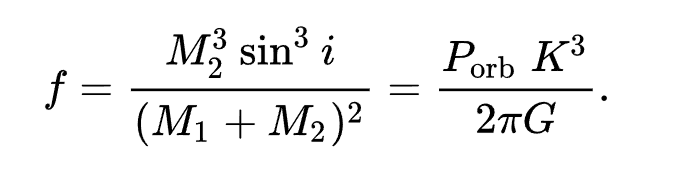

f = $\frac{{M_2}^{3}\sin^3(i)}{(M_1 + M_2)^2}$, $M_1 = M_{tot} - M_2$  
f = $\frac{{M_2}^{3}\sin^3(i)}{(M_{tot})^2}$,                        
$M_{tot}f = {M_2}^{3}\sin^3(i)$                                     
$M_2 = \frac{(M_{tot}f)^{\frac{1}{3}}}{\sin(i)}$

In [59]:
K = 45.66 * 1e3 #m/s see: https://vizier.cds.unistra.fr/viz-bin/VizieR-5?-out.add=.&-source=B/sb9&Seq=2412

f_binary = 0.1099 * M_sun #K**3 / (G * ω) # 0.1019 * M_sun 0.0002

M2 = ( (f_binary * M_tot**2) / np.sin(inc * (np.pi/180))**3 )**(1/3)
M1 = M_tot - M2

In [60]:
print('ω =', ω, 's^-1')
print('R1 =', R1/R_sun, r'R_sun')
print('R2 =', R2/R_sun, r'R_sun')
print('a =', semimajor_axis/AU, 'AU', 'or', semimajor_axis/R_sun, r'R_sun')
print('M_tot =',M_tot/M_sun, 'M_sun', 'or', M_tot, 'kg')
print('M2 =',M2/M_sun,'M_sun', 'or', M2, 'kg')
print('M1 =',M1/M_sun, 'M_sun', 'or', M1, 'kg')

ω = 7.000799617241737e-06 s^-1
R1 = 5.762149126162118 R_sun
R2 = 0.7383963619211709 R_sun
a = 0.10703122622106168 AU or 23.015155298376932 R_sun
M_tot = 1.5160362365009072 M_sun or 3.014510709238188e+30 kg
M2 = 0.6341843820702068 M_sun or 1.2610223722585123e+30 kg
M1 = 0.8818518544307005 M_sun or 1.7534883369796757e+30 kg


In [61]:
def orbital_parameters(vsini, P_rot, inc, R_ratio, a_R_ratio, f_binary):
    #rotational period
    ω_rot = 2*np.pi/(P_rot * 24 *3600) #for consistency sake 
    r1 = vsini/(np.sin(inc*(np.pi/180))*ω_rot)
    r2 = r1*R_ratio
    
    #orbital parameters
    a_tot = a_R_ratio * (r1+r2)
    M_tot = (ω_rot**2 * (a_tot * 1e3)**3 / G)
    
    f_binary = f_binary * M_sun
    
    M2 = ( (f_binary * M_tot**2) / np.sin(inc * (np.pi/180))**3 )**(1/3)
    M1 = M_tot - M2
    return ω_rot, r1, r2, a_tot, M_tot, M2, M1

In [62]:
def orbit_errors(params, errors):
    calc_params = np.array(orbital_parameters(params[0], params[1], params[2], 
                       params[3], params[4], params[5]))
    
    plus_params = np.array(params) + np.array(errors)
    minus_params = np.array(params) - np.array(errors)
    
    if plus_params[2] > 90:
        plus_params[2] = 90
    
    calc_plus = np.array(orbital_parameters(plus_params[0], plus_params[1], 
                                            plus_params[2], plus_params[3], 
                                            plus_params[4], plus_params[5]))
    
    calc_minus = np.array(orbital_parameters(minus_params[0], minus_params[1], 
                                             minus_params[2], minus_params[3], 
                                             minus_params[4], minus_params[5]))
    plus_error = calc_plus -  calc_params
    minus_error = calc_minus - calc_params
    return plus_error, minus_error

In [63]:
vsini_error = 0.6163918306474289
plus_error, minus_error = orbit_errors([av_vsini, rot_period, inc, radius_ratio, a_to_R_ratio, 0.1099], 
             [vsini_error,0.1,5,0.01,0.1, 0.0002])

In [64]:
print(plus_error)
print(minus_error)

[-6.67526179e-08  1.14366505e+05  5.58865466e+04  1.07204850e+06
  5.77458142e+29  1.52556018e+29  4.24902124e+29]
[ 6.80503377e-08 -8.35253456e+04 -4.99554570e+04 -9.11483117e+05
 -4.36670414e+29 -1.13172275e+29 -3.23498138e+29]


In [65]:
#MASSES (with errors)
print('Lower Bounds for errors - accounts for errors in vsini, binary mass function')
print('---------------------------------------------------------------------------------')
print('M_tot =',M_tot/M_sun, ' | +', plus_error[4]/M_sun, '/', minus_error[4]/M_sun, 'M_sun')
print('or', M_tot, ' | +', plus_error[4], '/', minus_error[4], 'kg')
print()
print('M2 =',M2/M_sun,' | +', plus_error[5]/M_sun, '/', minus_error[5]/M_sun,'M_sun')
print('or', M2,  ' | +', plus_error[5], '/', minus_error[5], 'kg')
print()
print('M1 =',M1/M_sun, ' | +', plus_error[6]/M_sun, '/', minus_error[6]/M_sun,'M_sun')
print('or', M1,  ' | +', plus_error[6], '/', minus_error[6], 'kg')

Lower Bounds for errors - accounts for errors in vsini, binary mass function
---------------------------------------------------------------------------------
M_tot = 1.5160362365009072  | + 0.2904111322298908 / -0.21960717152929743 M_sun
or 3.014510709238188e+30  | + 5.774581419040305e+29 / -4.366704135835995e+29 kg

M2 = 0.6341843820702068  | + 0.07672238489490159 / -0.05691579383098261 M_sun
or 1.2610223722585123e+30  | + 1.5255601768318065e+29 / -1.1317227510622712e+29 kg

M1 = 0.8818518544307005  | + 0.2136887473349892 / -0.1626913776983149 M_sun
or 1.7534883369796757e+30  | + 4.249021242208499e+29 / -3.234981384773725e+29 kg


In [66]:
print((M1 + plus_error[6])/M_sun)

1.0955406017656897


In [67]:
print((R2 + plus_error[2])/R_sun)
print((R2 + minus_error[2])/R_sun)
print((plus_error[2] - minus_error[2])/R_sun)

0.8187277499096727
0.666590329209634
0.1521374207000387


In [68]:
print((plus_error[1])/R_sun)
print((-minus_error[2])/R_sun)

0.16439054859989075
0.07180603271153688


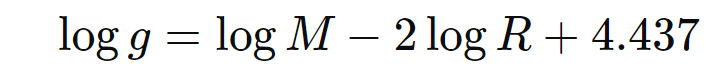

In [70]:
print(M1/M_sun)
print(R1/R_sun)

logg = np.log10(M1/M_sun) - 2*np.log10(R1/R_sun) + 4.437

print(logg)

0.8818518544307005
5.762149126162118
2.861226644991161


In [60]:
R_peaks = abs(np.array(peak_diffs[:,2], dtype=np.float64))*(1/(np.sin(inc*(np.pi/180))*ω))
R_ps = abs(abs(np.array(peak_diffs[:,2], dtype=np.float64))*(1/(np.sin(inc*(np.pi/180))*ω)) - R1)#peak to surface
#Math: (v_peak - vsini)/sin(i)


BJDs_bluepeak = np.array([BJDs[2],BJDs[4],BJDs[5],BJDs[6]])
print('date', '\t\t','circumstellar distance')
for i in range(len(R_peaks)):
    print(peak_diffs[i,0],'\t', R_ps[i], 'km or', R_ps[i]/R_sun, 'R_sun')

date 		 circumstellar distance
2021-01-31 	 2879371.7148329453 km or 4.138812296726959 R_sun
2021-03-30 	 37726.984069247264 km or 0.05422881136876134 R_sun
2021-04-23 	 66363.18352429662 km or 0.0953905182180489 R_sun
2021-04-24 	 1630511.282592758 km or 2.343698839431879 R_sun
2021-04-25 	 895813.1554917865 km or 1.2876428855710602 R_sun


In [61]:
peak_data = {'Dates': peak_diffs[:,0], 'BJDs': BJDs_bluepeak, 'Raw Velocities (km/s)': peak_diffs[:,1], 
             'v_primary - v_peak (km/s)': peak_diffs[:,2], 'Dist from center (km)': R_peaks, 
             'Dist from center (R_sun)': R_peaks/R_sun, 'Dist from surface (km)': R_ps,
            'Dist from surface (R_sun)': R_ps/R_sun}
#df = pd.DataFrame(peak_data)
#print(df)

#df.to_csv('HUVir_flare_parameters.csv', index=False)

In [63]:
T1 = 4400
T_sun = 5772 #5770

σ = 5.670374419e-8
L_sun = 3.828e26
#L 4pi (R^4) (T^4)
L_HUVir = (4*np.pi * σ *((R1*1e3)**2)*(T1**4))/L_sun



print(L_HUVir)

11.211749133717325


In [64]:
print('hello')

hello


In [67]:
T2 = T1 * 1.08

In [68]:
print(T2)

4752.0


# Normalized Flux

In [ ]:
import saphires as saph

In [ ]:
new_flux = saph.utils.cont_norm(spec['wav'][o_ha], spec['flux'][o_ha])

new_flux4 = saph.utils.cont_norm(spec4['wav'][o_ha], spec4['flux'][o_ha])
new_flux8 = saph.utils.cont_norm(spec8['wav'][o_ha], spec8['flux'][o_ha])

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(spec['wav'][o_ha], new_flux)
ax[1].plot(spec['wav'][o_ha], spec['flux'][o_ha])
ax[0].set_xlim(6556,6570)
ax[1].set_xlim(6556,6570)
#ax.set_xlim(6556, 6570)

fig2, ax2 = plt.subplots(1,2, figsize=(20,7))
ax2[0].plot(spec4['wav'][o_ha], new_flux4)
ax2[1].plot(spec4['wav'][o_ha], spec4['flux'][o_ha])
ax2[0].set_xlim(6556,6570)
ax2[1].set_xlim(6556,6570)
#ax.set_xlim(6556, 6570)

fig3, ax3 = plt.subplots(1,2, figsize=(20,7))
ax3[0].plot(spec8['wav'][o_ha], new_flux8)
ax3[1].plot(spec8['wav'][o_ha], spec8['flux'][o_ha])
ax3[0].set_xlim(6556,6570)
ax3[1].set_xlim(6556,6570)
#ax.set_xlim(6556, 6570)

In [ ]:
new_flux_2 = saph.utils.cont_norm(spec['wav'][o_CaH], spec['flux'][o_CaH], 10)

new_flux4_2 = saph.utils.cont_norm(spec4['wav'][o_CaH], spec4['flux'][o_CaH], 10)
new_flux8_2 = saph.utils.cont_norm(spec8['wav'][o_CaH], spec8['flux'][o_CaH], 10)



fig, ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(spec['wav'][o_CaH], new_flux_2)
ax[1].plot(spec['wav'][o_CaH], spec['flux'][o_CaH])
ax[0].set_xlim(l_CaH-5, l_CaH+5)
ax[1].set_xlim(l_CaH-5, l_CaH+5)
#ax.set_xlim(6556, 6570)

fig2, ax2 = plt.subplots(1,2, figsize=(20,7))
ax2[0].plot(spec4['wav'][o_CaH], new_flux4_2)
ax2[1].plot(spec4['wav'][o_CaH], spec4['flux'][o_CaH])
ax2[0].set_xlim(l_CaH-5, l_CaH+5)
ax2[1].set_xlim(l_CaH-5, l_CaH+5)

fig3, ax3 = plt.subplots(1,2, figsize=(20,7))
ax3[0].plot(spec8['wav'][o_CaH], new_flux8_2)
ax3[1].plot(spec8['wav'][o_CaH], spec8['flux'][o_CaH])
ax3[0].set_xlim(l_CaH-5, l_CaH+5)
ax3[1].set_xlim(l_CaH-5, l_CaH+5)
ax3[0].set_ylim(0, top=3)
ax3[1].set_ylim(0, top=3500)
#ax.set_xlim(6556, 6570)

In [ ]:




new_flux_3 = saph.utils.cont_norm(spec['wav'][o_Li], spec['flux'][o_Li], 10)

new_flux4_3 = saph.utils.cont_norm(spec4['wav'][o_Li], spec4['flux'][o_Li], 200)
new_flux8_3 = saph.utils.cont_norm(spec8['wav'][o_Li], spec8['flux'][o_Li], 10)
new_flux9_3 = saph.utils.cont_norm(spec9['wav'][o_Li], spec9['flux'][o_Li], 10)


fig, ax = plt.subplots(1,2, figsize=(20,7))
ax[0].plot(spec['wav'][o_Li], new_flux_3) #velocity_spec(wav, bvcorr, lam)), new_flux_3)
ax[1].plot(spec['wav'][o_Li], spec['flux'][o_Li])
ax[0].axvline(vel_to_wav(RVs[0], BVCORRs[0], l_Li) , ls = '--', color = 'red')
#ax.set_xlim(6556, 6570)

fig2, ax2 = plt.subplots(1,2, figsize=(20,7))
ax2[0].plot(spec4['wav'][o_Li], new_flux4_3)
ax2[1].plot(spec4['wav'][o_Li], spec4['flux'][o_Li])
ax2[0].axvline(vel_to_wav(RVs[3], BVCORRs[3], l_Li) , ls = '--', color = 'red')


fig3, ax3 = plt.subplots(1,2, figsize=(20,7))
ax3[0].plot(spec8['wav'][o_Li], new_flux8_3)
ax3[1].plot(spec8['wav'][o_Li], spec8['flux'][o_Li])

fig4, ax4 = plt.subplots(1,2, figsize=(20,7))
ax4[0].plot(spec9['wav'][o_Li], new_flux9_3)
ax4[1].plot(spec9['wav'][o_Li], spec9['flux'][o_Li])

#ax.set_xlim(6556, 6570)

In [ ]:
def norm_filterer(region, bounds, spect):  
    
    tempList_flux = saph.utils.cont_norm(spect['wav'][region], spect['flux'][region])
    spec_where = np.where((spect['wav'][region]>bounds[0]) & (spect['wav'][region]<bounds[1]))
    tempList_wavelength = spect['wav'][region][spec_where]
    tempList_flux = tempList_flux[spec_where]
    
    return  tempList_flux,  tempList_wavelength

In [ ]:
def norm_plt_spec(spect, index, l_spec, o_spec, lims, guesses, ax_name, plt_place = [0,0], 
              l_col = 'r', lsec_col = 'b', CoM_col = 'm', spec_col = 'tab:blue', gauss_col = 'tab:orange',
              xlims = ['none', 'none'], ylims = ['none', 'none'], 
             line_class = None, RV_Mode = True, plt_gauss = False, plt_sec = False):
    
    #Fits Gaussian
    flux, wavelength = norm_filterer(o_spec, lims, spect)
    if (plt_gauss == True):
        popt, pcov = scipy.optimize.curve_fit(gauss, wavelength, flux, guesses)
        fit_flux = gauss(wavelength, popt[0], popt[1], popt[2], popt[3])
    else:
        plt_gauss = False

    if RV_Mode == False:
        v_spec = wavelength
        com_rv = vel_to_wav(av_RV, BVCORRs[index], l_spec)
        low_vsini = vel_to_wav(RVs[index] - vsinis[index], BVCORRs[index], l_spec) 
        hi_vsini = vel_to_wav(RVs[index] + vsinis[index], BVCORRs[index], l_spec)
        prim_rv  = vel_to_wav(RVs[index], BVCORRs[index], l_spec)
        x_label = 'Wavelength (A)'
    else:
        v_spec = velocity_spec(wavelength, BVCORRs[index], l_spec)
        com_rv = av_RV
        low_vsini = RVs[index] - vsinis[index]
        hi_vsini = RVs[index] + vsinis[index]
        prim_rv  =  RVs[index]
        x_label  = 'Barycentric Radial Velocity (km/s)'
    
    #Colors
    l_col = l_col
    CoM_col = CoM_col
    spec_col = spec_col
    lsec_col = lsec_col
    gauss_col = gauss_col
    
    #plt placements
    row, col = plt_place
    
    #xlim and ylims
    xlim1, xlim2 = xlims
    ylim1, ylim2  = ylims
    
    #sets Title
    if line_class == None:
        fig_title = date[index]
    else:
        fig_title = date[index] + " (" + str(line_class) + ")"

    #Axis type
    if (row == None ) and (col == None):
        #Plot
        fig, ax = plt.subplots(figsize=(10,7))
        ax.set_title(fig_title, fontsize = 24)
        #Shaded Region
        ax.axvline(low_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax.axvline(hi_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax.axvspan(low_vsini, hi_vsini, alpha=0.3, color= l_col)
        #Fits
        ax.plot(v_spec, flux, 'ko', ms = 9, mec = l_col)
        ax.plot(v_spec, flux, color = spec_col ,lw = 3)

        if plt_gauss == True:
            ax.plot(v_spec, fit_flux, color = gauss_col, lw = 3)
            #Set X and y lims
        if (xlim1 != 'none') and (xlim2 != 'none'):
            ax.set_xlim(xlim1, xlim2)
        elif(xlim1 == 'none') and (xlim2 != 'none'):
            ax.set_xlim(right=xlim2)
        elif(xlim1 != 'none') and (xlim2 == 'none'):
            ax.set_xlim(left=xlim1)

        if (ylim1 != 'none') and (ylim2 != 'none'):
            ax.set_ylim(ylim1, ylim2)
        elif(ylim1 == 'none') and (ylim2 != 'none'):
            ax.set_ylim(top = ylim2)
        elif(ylim1 != 'none') and (ylim2 == 'none'):
            ax.set_ylim(bottom=ylim1)

        #Spec Lines
        ax.axvline(prim_rv, color = l_col, ls = '--', label ='Primary RV', lw = 4)
        ax.axvline(com_rv, color = CoM_col, ls = '-', label = 'CoM RV', lw = 4)

        #Set Labels
        ax.set_ylabel('Flux', fontsize = 24)
        ax.set_xlabel(x_label, fontsize = 24)
        ax.legend(fontsize= 24)
        ax.tick_params(axis='both', labelsize = 24)
        return fig

    elif ((row == None) or (col == None)):
        if (row == None):
            row = col
        #Plot
        ax_name[row].set_title(fig_title, fontsize = 24)
        #Shaded Region
        ax_name[row].axvline(low_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row].axvline(hi_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row].axvspan(low_vsini, hi_vsini, alpha=0.3, color= l_col)
        #Fits
        ax_name[row].plot(v_spec, flux, 'ko', ms = 9, mec = l_col)
        ax_name[row].plot(v_spec, flux, color = spec_col ,lw = 3)

        if plt_gauss == True:
            ax_name[row].plot(v_spec, fit_flux, color = gauss_col, lw = 3)

        #Spec Lines
        ax_name[row].axvline(prim_rv, color = l_col, ls = '--', label ='Primary RV', lw = 4)
        ax_name[row].axvline(com_rv, color = CoM_col, ls = '-', label = 'CoM RV', lw = 4)

        #Set X and y lims
        if (xlim1 != 'none') and (xlim2 != 'none'):
            ax_name[row].set_xlim(xlim1, xlim2)
        elif(xlim1 == 'none') and (xlim2 != 'none'):
            ax_name[row].set_xlim(right=xlim2)
        elif(xlim1 != 'none') and (xlim2 == 'none'):
            ax_name[row].set_xlim(left=xlim1)

        if (ylim1 != 'none') and (ylim2 != 'none'):
            ax_name[row].set_ylim(ylim1, ylim2)
        elif(ylim1 == 'none') and (ylim2 != 'none'):
            ax_name[row].set_ylim(top = ylim2)
        elif(ylim1 != 'none') and (ylim2 == 'none'):
            ax_name[row].set_ylim(bottom=ylim1)

        #Set Labels
        ax_name[row].set_ylabel('Flux', fontsize = 24)
        ax_name[row].set_xlabel(x_label, fontsize = 24)
        ax_name[row].legend(fontsize= 24)
        ax_name[row].tick_params(axis='both', labelsize = 24)

    else: 
        
        #Plot
        ax_name[row][col].set_title(fig_title, fontsize = 24)
        #Shaded Region
        ax_name[row][col].axvline(low_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row][col].axvline(hi_vsini, color = l_col, ls = "--", alpha = 0.3)
        ax_name[row][col].axvspan(low_vsini, hi_vsini, alpha=0.3, color= l_col)
        #Fits
        ax_name[row][col].plot(v_spec, flux, 'ko', ms = 9, mec = l_col)
        ax_name[row][col].plot(v_spec, flux, color = spec_col ,lw = 3)

        if plt_gauss == True:
            ax_name[row][col].plot(v_spec, fit_flux, color = gauss_col, lw = 3)

        #Spec Lines
        ax_name[row][col].axvline(prim_rv, color = l_col, ls = '--', label ='Primary RV', lw = 4)
        ax_name[row][col].axvline(com_rv, color = CoM_col, ls = '-', label = 'CoM RV', lw = 4)

        #Set X and y lims
        if (xlim1 != 'none') and (xlim2 != 'none'):
            ax_name[row][col].set_xlim(xlim1, xlim2)
        elif(xlim1 == 'none') and (xlim2 != 'none'):
            ax_name[row][col].set_xlim(right=xlim2)
        elif(xlim1 != 'none') and (xlim2 == 'none'):
            ax_name[row][col].set_xlim(left=xlim1)

        if (ylim1 != 'none') and (ylim2 != 'none'):
            ax_name[row][col].set_ylim(ylim1, ylim2)
        elif(ylim1 == 'none') and (ylim2 != 'none'):
            ax_name[row][col].set_ylim(top = ylim2)
        elif(ylim1 != 'none') and (ylim2 == 'none'):
            ax_name[row][col].set_ylim(bottom=ylim1)

        #Set Labels
        ax_name[row][col].set_ylabel('Flux', fontsize = 24)
        ax_name[row][col].set_xlabel(x_label, fontsize = 24)
        ax_name[row][col].legend(fontsize= 24)
        ax_name[row][col].tick_params(axis='both', labelsize = 24)

In [ ]:
def norm_line_autoplot(l_line, o_line, line_name = '', ran=5, rv_mode = True):
    fig, ax = plt.subplots(6, 2, figsize = (20, 42))
    fig.suptitle(line_name + " Spectrum " + star, fontsize = 40)
    rows = 0
    num_cols = 1
    cols = 0
    for j in [11, 2, 10, 0, 9, 3, 4, 5, 6, 1]:#(rvs_index):
        lshift = vel_to_wav(RVs[j], BVCORRs[j], l_line)
        line_lims = [lshift - ran, lshift + ran]
        norm_plt_spec(specs[j], j, l_line, o_line, line_lims, -1, ax, plt_place = [rows,cols], 
                      l_col = line_color, CoM_col = CoM_color, spec_col = wav_color , gauss_col = fit_color,
                      xlims = ['none', 'none'], ylims= ['none', 'none'], line_class = None,
                      RV_Mode = rv_mode, plt_gauss = False, plt_sec = False);
        if (cols == num_cols):
            cols = 0
            rows = rows + 1
        else:
            cols = cols + 1
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    return fig, ax

In [ ]:
fig, ax = norm_line_autoplot(l_Li, o_Li, 'Lithium')

In [ ]:
fig, ax = norm_line_autoplot(l_CaH, o_CaH, 'Ca II H')

In [ ]:
fig, ax = norm_line_autoplot(l_Hd, o_Hd, 'H' + r'$\delta$')

In [ ]:
fig, ax = norm_line_autoplot(l_hy, o_hy, 'H' + r'$\gamma$')

In [ ]:
fig, ax = norm_line_autoplot(l_hb, o_hb, 'H' + r'$\beta$')

In [ ]:
fig, ax = norm_line_autoplot(l_CaK, o_CaK, 'Ca II K', ran = 20, rv_mode = False)

In [206]:
print('Hello')

Hello
